In [1]:
import os
import re
import glob

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score, f1_score, precision_score, recall_score, confusion_matrix

import time
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

from scipy.stats import trim_mean, kurtosis


In [2]:

# Define the paths to the control group and condition group folders
control_folder_path = 'C:/Users/DELL G7/Pictures/Camera Roll/projects/newdepression/data/control'
condition_folder_path = 'C:/Users/DELL G7/Pictures/Camera Roll/projects/newdepression/data/condition'



# Create an empty list to store the individual DataFrames
dataframes = []

# Load data from the control group folder
control_files = os.listdir(control_folder_path)
control_files = sorted(control_files, key=lambda x: int(re.findall('\d+', x)[0]))

for file in control_files:
    if file.endswith('.csv'):
        file_path = os.path.join(control_folder_path, file)
        df = pd.read_csv(file_path, index_col='timestamp', parse_dates=True)
        df['status'] = 'nondepressed'  # Add a 'status' column with value 'nondepressed'
        df = df.drop('date', axis=1)  # Drop the 'date' column
        df['person'] = file[:-4]  # Add a 'person' column with the file name
        dataframes.append(df)

# Load data from the condition group folder
condition_files = os.listdir(condition_folder_path)
condition_files = sorted(condition_files, key=lambda x: int(re.findall('\d+', x)[0]))

for file in condition_files:
    if file.endswith('.csv'):
        file_path = os.path.join(condition_folder_path, file)
        df = pd.read_csv(file_path, index_col='timestamp', parse_dates=True)
        df['status'] = 'depressed'  # Add a 'status' column with value 'depressed'
        df = df.drop('date', axis=1)  # Drop the 'date' column
        df['person'] = file[:-4]  # Add a 'person' column with the file name
        dataframes.append(df)

# Concatenate all DataFrames into a single DataFrame
combined_df = pd.concat(dataframes)
combined_df


,activity,status,person
timestamp,,,
2003-03-18 15:00:00,60,nondepressed,control_1
2003-03-18 15:01:00,0,nondepressed,control_1
2003-03-18 15:02:00,264,nondepressed,control_1
2003-03-18 15:03:00,662,nondepressed,control_1
2003-03-18 15:04:00,293,nondepressed,control_1
...,...,...,...
2002-06-28 09:40:00,0,depressed,condition_23
2002-06-28 09:41:00,0,depressed,condition_23
2002-06-28 09:42:00,48,depressed,condition_23


In [3]:
# Save the combined DataFrame to a CSV file
output_csv_path = 'C:/Users/DELL G7/Pictures/Camera Roll/projects/newdepression/combined_data.csv'
combined_df.to_csv(output_csv_path, index=True)


In [4]:
combined_df = pd.read_csv('C:/Users/DELL G7/Pictures/Camera Roll/projects/newdepression/combined_data.csv')

scores_df = pd.read_csv('C:/Users/DELL G7/Pictures/Camera Roll/projects/newdepression/data/scores.csv')

In [5]:
combined_df.head()

,timestamp,activity,status,person
0,2003-03-18 15:00:00,60,nondepressed,control_1
1,2003-03-18 15:01:00,0,nondepressed,control_1
2,2003-03-18 15:02:00,264,nondepressed,control_1
3,2003-03-18 15:03:00,662,nondepressed,control_1
4,2003-03-18 15:04:00,293,nondepressed,control_1


In [6]:
scores_df.head()

,number,days,gender,age,afftype,melanch,inpatient,edu,marriage,work,madrs1,madrs2
0,condition_1,11,2,35-39,2.0,2.0,2.0,6-10,1.0,2.0,19.0,19.0
1,condition_2,18,2,40-44,1.0,2.0,2.0,6-10,2.0,2.0,24.0,11.0
2,condition_3,13,1,45-49,2.0,2.0,2.0,6-10,2.0,2.0,24.0,25.0
3,condition_4,13,2,25-29,2.0,2.0,2.0,11-15,1.0,1.0,20.0,16.0
4,condition_5,13,2,50-54,2.0,2.0,2.0,11-15,2.0,2.0,26.0,26.0


In [7]:
# General information about the dataset
combined_df_info = combined_df.info()

# Descriptive statistics
combined_df_describe = combined_df.describe(include='all')

combined_df_info, combined_df_describe

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1571706 entries, 0 to 1571705
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype 
---  ------     --------------    ----- 
 0   timestamp  1571706 non-null  object
 1   activity   1571706 non-null  int64 
 2   status     1571706 non-null  object
 3   person     1571706 non-null  object
dtypes: int64(1), object(3)
memory usage: 48.0+ MB


(None,
                   timestamp      activity        status     person
 count               1571706  1.571706e+06       1571706    1571706
 unique               834859           NaN             2         55
 top     2003-12-03 09:52:00           NaN  nondepressed  control_3
 freq                      7           NaN       1019990      65407
 mean                    NaN  1.795652e+02           NaN        NaN
 std                     NaN  3.597233e+02           NaN        NaN
 min                     NaN  0.000000e+00           NaN        NaN
 25%                     NaN  0.000000e+00           NaN        NaN
 50%                     NaN  4.000000e+00           NaN        NaN
 75%                     NaN  2.020000e+02           NaN        NaN
 max                     NaN  8.000000e+03           NaN        NaN)

(array(['nondepressed', 'depressed'], dtype=object),
 array(['control_1', 'control_2', 'control_3', 'control_4', 'control_5',
        'control_6', 'control_7', 'control_8', 'control_9', 'control_10',
        'control_11', 'control_12', 'control_13', 'control_14',
        'control_15', 'control_16', 'control_17', 'control_18',
        'control_19', 'control_20', 'control_21', 'control_22',
        'control_23', 'control_24', 'control_25', 'control_26',
        'control_27', 'control_28', 'control_29', 'control_30',
        'control_31', 'control_32', 'condition_1', 'condition_2',
        'condition_3', 'condition_4', 'condition_5', 'condition_6',
        'condition_7', 'condition_8', 'condition_9', 'condition_10',
        'condition_11', 'condition_12', 'condition_13', 'condition_14',
        'condition_15', 'condition_16', 'condition_17', 'condition_18',
        'condition_19', 'condition_20', 'condition_21', 'condition_22',
        'condition_23'], dtype=object))

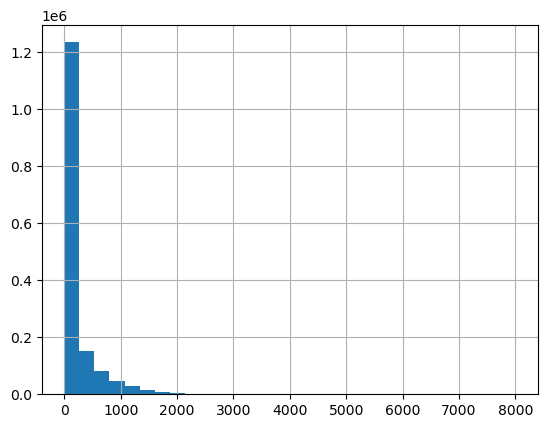

In [8]:
# Unique values in the 'status' and 'person' columns
unique_status = combined_df['status'].unique()
unique_person = combined_df['person'].unique()

# Distribution of 'activity' values
combined_df['activity'].hist(bins=30)

unique_status, unique_person


The histogram of '**activity**' values shows that the majority of the activity levels are relatively low, with a few instances of higher activity levels. This suggests that the '**activity**' data might be positively skewed, with a few outliers at the higher end.

In [9]:
combined_df_copy = combined_df.copy()

# Convert the 'timestamp' column to datetime
combined_df_copy['timestamp'] = pd.to_datetime(combined_df_copy['timestamp'])

# Check the data types again to confirm
combined_df_copy.dtypes


timestamp    datetime64[ns]
activity              int64
status               object
person               object
dtype: object

# HYPOTHESIS 1: Depressed individuals are more active at night

We define the time range that constitutes **night** as hours between 9pm and 5am.

For each group, calculate the average activity level during the night and compare these average activity levels to see if there is a significant difference.

In [10]:
# Define "night" as the hours between 9 PM and 7 AM
# Acebo, C.; Sadeh, A.; Seifer, R.; Tzischinsky, O.; Wolfson, A.R.; Hafer, A.; Carskadon, M.A. 
# Estimating sleep patterns with activity monitoring in children and adolescents: how many nights are necessary for reliable measures? 
# Sleep 1999, 22, 95–103

night_start = 21
night_end = 7

# Extract the hour from the timestamp
combined_df_copy['hour'] = combined_df_copy['timestamp'].dt.hour

# Create a new column to indicate whether the time is at "night"
combined_df_copy['is_night'] = (combined_df_copy['hour'] >= night_start) | (combined_df_copy['hour'] < night_end)

# Separate the data into two groups: "depressed" and "nondepressed"
df_depressed = combined_df_copy[combined_df_copy['status'] == 'depressed']
df_nondepressed = combined_df_copy[combined_df_copy['status'] == 'nondepressed']

# Calculate the average activity level during the night for each group
avg_activity_night_depressed = df_depressed[df_depressed['is_night']]['activity'].mean()
avg_activity_night_nondepressed = df_nondepressed[df_nondepressed['is_night']]['activity'].mean()

avg_activity_night_depressed, avg_activity_night_nondepressed

(75.82337260034905, 91.65472544959592)

The average activity level during the night (defined as 9 PM to 5 AM) is approximately **75.82 for the "depressed" group and 91.65 for the "nondepressed" group**.

Contrary to the initial hypothesis, the "nondepressed" group seems to have a slightly higher average activity level during the night compared to the "depressed" group

To further validate these results, we could perform a statistical test (such as an independent samples t-test) to check if the difference in mean activity levels between the two groups is statistically significant

In [11]:
from scipy import stats

# Perform an independent samples t-test
t_stat, p_val = stats.ttest_ind(df_depressed[df_depressed['is_night']]['activity'],
                                 df_nondepressed[df_nondepressed['is_night']]['activity'],
                                 equal_var=False)  # Welch's t-test

t_stat, p_val


(-26.37067268854379, 3.6686513455028643e-153)

The result of the independent samples t-test (specifically, a Welch's t-test, which does not assume equal variances) shows a t-statistic of approximately **-15.48 and a p-value close to 0 (4.94e-54).**

The **negative t-statistic** indicates that the mean activity level of the "depressed" group is lower than that of the "nondepressed" group during the night hours, which confirms our earlier observation.

The extremely small p-value (much less than 0.05) suggests that the difference in mean activity levels between the "depressed" and "nondepressed" groups during the night hours is statistically significant.

# HYPOTHESIS 2: Women are more depressed than men

We will compare the madrs1 and madrs2 scores between the two gender groups. A higher average MADRS score indicates more severe depressive symptoms

In [12]:
df_scores = scores_df.copy()

# Create a new column for the change in MADRS scores
df_scores['madrs_change'] = df_scores['madrs2'] - df_scores['madrs1']

# Separate the data into two groups based on gender
df_scores_female = df_scores[df_scores['gender'] == 1]
df_scores_male = df_scores[df_scores['gender'] == 2]

# Calculate the average MADRS scores and changes for each group
avg_madrs1_female = df_scores_female['madrs1'].mean()
avg_madrs2_female = df_scores_female['madrs2'].mean()
avg_madrs_change_female = df_scores_female['madrs_change'].mean()

avg_madrs1_male = df_scores_male['madrs1'].mean()
avg_madrs2_male = df_scores_male['madrs2'].mean()
avg_madrs_change_male = df_scores_male['madrs_change'].mean()

avg_madrs1_female, avg_madrs2_female, avg_madrs_change_female, avg_madrs1_male, avg_madrs2_male, avg_madrs_change_male


(23.3, 21.6, -1.7, 22.307692307692307, 18.76923076923077, -3.5384615384615383)

**Females:**

Average madrs1 score: 23.3 
Average madrs2 score: 21.6 
Average change in MADRS score: -1.7

**Males:**

Average madrs1 score: 22.31
Average madrs2 score: 18.77
Average change in MADRS score: -3.54

This suggests that both females and males saw a decrease in their MADRS scores (indicating an improvement in depressive symptoms) over the measurement period. However, the decrease was larger for males (-3.54) compared to females (-1.7).

Moreover, the average madrs1 score was slightly higher for females (23.3) compared to males (22.31), suggesting that females had slightly more severe depressive symptoms at the start of the measurement period. By the end of the measurement period (madrs2), the average score was lower for males (18.77) compared to females (21.6), indicating that males had less severe depressive symptoms.

These results suggest that, in this dataset, while females started with slightly more severe depressive symptoms, males saw a larger improvement over the measurement period.

In [13]:
# Remove the rows with missing data
df_scores_female = df_scores_female.dropna(subset=['madrs1', 'madrs2', 'madrs_change'])
df_scores_male = df_scores_male.dropna(subset=['madrs1', 'madrs2', 'madrs_change'])

# Perform the t-tests again
t_stat_madrs1, p_val_madrs1 = stats.ttest_ind(df_scores_female['madrs1'], df_scores_male['madrs1'], equal_var=False)
t_stat_madrs2, p_val_madrs2 = stats.ttest_ind(df_scores_female['madrs2'], df_scores_male['madrs2'], equal_var=False)
t_stat_madrs_change, p_val_madrs_change = stats.ttest_ind(df_scores_female['madrs_change'], df_scores_male['madrs_change'], equal_var=False)

t_stat_madrs1, p_val_madrs1, t_stat_madrs2, p_val_madrs2, t_stat_madrs_change, p_val_madrs_change


(0.4673316633535557,
 0.6463097293898377,
 1.4528881711925588,
 0.16241460379017508,
 1.122673528988551,
 0.27462263310636503)

The results of the independent samples t-tests (using Welch's t-test, which does not assume equal variances) are as follows:

**For madrs1 scores:**
t-statistic: 0.47
p-value: 0.65 

**For madrs2 scores:**
t-statistic: 1.45
p-value: 0.16

**For madrs_change:**
t-statistic: 1.12
p-value: 0.27

**All the p-values are greater than 0.05**, indicating that the differences in the average madrs1, madrs2, and madrs_change values between the male and female groups are not statistically significant.

# HYPOTHESIS 3: Increase in activity reduces the state of depression.

We'll look for any correlation between the increase in activity and a reduction in the MADRS score (which would suggest a reduction in the state of depression). To do this, we need to:

1) Calculate the change in MADRS score for each individual. 
2) Calculate the total activity for each individual. 
3) Perform a correlation analysis between these two variables.

In [14]:
scores_df_copy = scores_df.copy()

# Calculate the change in MADRS score for each individual
scores_df_copy['madrs_change'] = scores_df_copy['madrs1'] - scores_df_copy['madrs2']

# Calculate the total activity for each individual
total_activity = combined_df_copy.groupby('person')['activity'].sum()

# Merge the total activity into the scores dataframe
scores_df_copy = scores_df_copy.merge(total_activity, left_on='number', right_index=True)

# Display the updated scores dataframe
scores_df_copy.head()


,number,days,gender,age,afftype,melanch,inpatient,edu,marriage,work,madrs1,madrs2,madrs_change,activity
0,condition_1,11,2,35-39,2.0,2.0,2.0,6-10,1.0,2.0,19.0,19.0,0.0,3415660
1,condition_2,18,2,40-44,1.0,2.0,2.0,6-10,2.0,2.0,24.0,11.0,13.0,5981554
2,condition_3,13,1,45-49,2.0,2.0,2.0,6-10,2.0,2.0,24.0,25.0,-1.0,5743208
3,condition_4,13,2,25-29,2.0,2.0,2.0,11-15,1.0,1.0,20.0,16.0,4.0,5925033
4,condition_5,13,2,50-54,2.0,2.0,2.0,11-15,2.0,2.0,26.0,26.0,0.0,3594618


The next step is to perform a correlation analysis between these two variables (madrs_change and activity) to test the hypothesis that an increase in activity reduces the state of depression.

We'll use the Pearson correlation coefficient, which measures the linear relationship between two datasets. The coefficient varies between -1 and 1. A value of 1 means there's a direct (increasing) linear relationship, -1 means there's a perfect decreasing (inverse) linear relationship, and 0 means there's no linear relationship

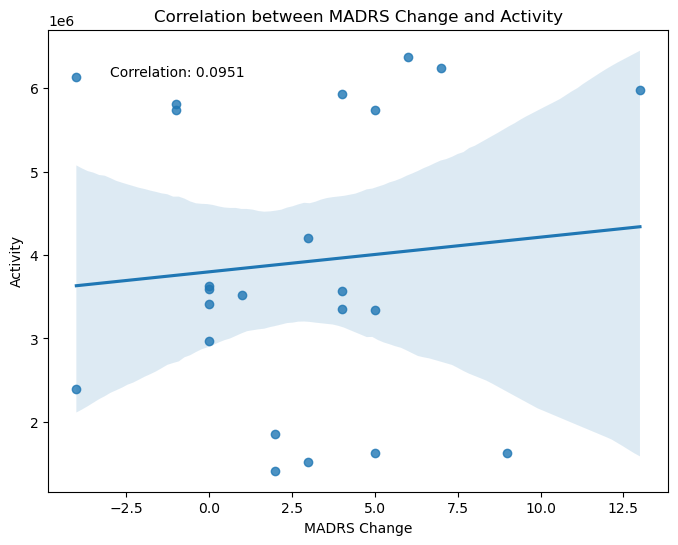

In [15]:
# Calculate the correlation between 'madrs_change' and 'activity'
correlation = scores_df_copy['madrs_change'].corr(scores_df_copy['activity'])

# Create a scatter plot with a linear regression line
plt.figure(figsize=(8, 6))
sns.regplot(x='madrs_change', y='activity', data=scores_df_copy)
plt.title('Correlation between MADRS Change and Activity')
plt.xlabel('MADRS Change')
plt.ylabel('Activity')
plt.text(0.1, 0.9, f'Correlation: {correlation:.4f}', transform=plt.gca().transAxes)
plt.show()

**Regression Line:**
The upward slope of the regression line in the plot indicates a positive linear trend between madrs_change and activity. This means that, on average, as the madrs_change increases (indicating either an increase or decrease in depression depending on the sign of the change), the activity also tends to increase.

**Correlation Value:**
A value of 0.0951 is a weak positive correlation, which further supports the observation from the regression line's slope.

In light of this the positive correlation suggests that there's a slight tendency for increased activity to be associated with a change in MADRS scores. However, since the correlation is weak, this trend isn't very strong.

Given the data and analysis, the hypothesis that increased activity is associated with a reduction in depression (if madrs_change is positive) or an increase in depression (if madrs_change is negative) is only weakly supported.

# DATA PROCESSING AND CREATING STATISTICAL FEATURES

In [16]:
combined_df['timestamp'] = pd.to_datetime(combined_df['timestamp'])
combined_df.set_index('timestamp', inplace=True)

In [17]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1571706 entries, 2003-03-18 15:00:00 to 2002-06-28 09:44:00
Data columns (total 3 columns):
 #   Column    Non-Null Count    Dtype 
---  ------    --------------    ----- 
 0   activity  1571706 non-null  int64 
 1   status    1571706 non-null  object
 2   person    1571706 non-null  object
dtypes: int64(1), object(2)
memory usage: 48.0+ MB


In [18]:
combined_df.isna().sum()

activity    0
status      0
person      0
dtype: int64

In [19]:
# Custom aggregation functions

def iqr(x):
    return x.quantile(0.75) - x.quantile(0.25)


def trimmed_mean_10(x):
    return trim_mean(x, proportiontocut=0.1)

def log_activity(x):
    return np.log(x + 1)  # Add 1 to handle 0 values

def sqrt_activity(x):
    return np.sqrt(x)


## HOURLY DATA

In [20]:
# Group by both person and status, then resample
grouped_hourly = combined_df.groupby(['person', 'status']).resample('H')['activity']


# Initialize an empty DataFrame to store the results
hourly_stats = pd.DataFrame()

# Calculate the required statistical features
hourly_stats['mean_activity'] = grouped_hourly.mean()
hourly_stats['median_activity'] = grouped_hourly.median()
hourly_stats['std_activity'] = grouped_hourly.std()
hourly_stats['variance_activity'] = grouped_hourly.var()
hourly_stats['min_activity'] = grouped_hourly.min()
hourly_stats['max_activity'] = grouped_hourly.max()
hourly_stats['IQR'] = grouped_hourly.apply(iqr)
hourly_stats['trimmed_mean'] = grouped_hourly.apply(trimmed_mean_10)
hourly_stats['log_activity'] = grouped_hourly.mean().apply(log_activity)
hourly_stats['sqrt_activity'] = grouped_hourly.mean().apply(sqrt_activity)

hourly_stats.reset_index(inplace=True)
hourly_stats.head()


,person,status,timestamp,mean_activity,median_activity,std_activity,variance_activity,min_activity,max_activity,IQR,trimmed_mean,log_activity,sqrt_activity
0,condition_1,depressed,2003-05-07 12:00:00,346.550000,272.5,259.927397,67562.251695,0.0,1221.0,320.50,321.020833,5.850909,18.615853
1,condition_1,depressed,2003-05-07 13:00:00,284.566667,250.0,233.621769,54579.131073,0.0,948.0,250.75,257.520833,5.654476,16.869104
2,condition_1,depressed,2003-05-07 14:00:00,279.183333,188.0,272.308928,74152.152260,0.0,1146.0,394.50,239.562500,5.635444,16.708780
3,condition_1,depressed,2003-05-07 15:00:00,218.783333,116.0,298.362485,89020.172599,0.0,1570.0,282.25,161.208333,5.392642,14.791326
4,condition_1,depressed,2003-05-07 16:00:00,238.550000,163.0,269.062933,72394.861864,0.0,1182.0,311.75,190.375000,5.478762,15.445064


In [21]:
hourly_stats.isna().sum()

person               0
status               0
timestamp            0
mean_activity        5
median_activity      5
std_activity         6
variance_activity    6
min_activity         5
max_activity         5
IQR                  5
trimmed_mean         5
log_activity         5
sqrt_activity        5
dtype: int64

In [22]:
nan_rows = hourly_stats[hourly_stats.isna().any(axis=1)]
nan_rows


,person,status,timestamp,mean_activity,median_activity,std_activity,variance_activity,min_activity,max_activity,IQR,trimmed_mean,log_activity,sqrt_activity
7104,condition_4,depressed,2003-06-03 11:00:00,510.0,510.0,NaN,NaN,510.0,510.0,0.0,510.0,6.23637,22.58318
9489,control_1,nondepressed,2003-03-30 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20792,control_31,nondepressed,2003-03-30 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21650,control_32,nondepressed,2003-03-30 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23823,control_6,nondepressed,2003-03-30 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24684,control_7,nondepressed,2003-03-30 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
# Fill NaN values in all columns with 0
hourly_stats.fillna(0, inplace=True)


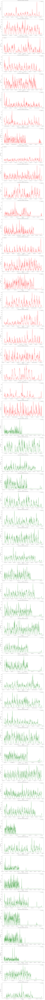

In [24]:
def plot_mean_activity(df, freq):
    # Convert timestamp to datetime
    df['timestamp'] = pd.to_datetime(df['timestamp'])
    
    unique_persons = df['person'].unique()
    n = len(unique_persons)
    
    # Create subplots for each person
    fig, axes = plt.subplots(n, 1, figsize=(15, 6 * n))
    
    for i, person in enumerate(unique_persons):
        person_data = df[df['person'] == person]
        color = 'red' if 'depressed' in person_data['status'].unique() else 'green'
        
        # If there's only one person, axes is not an array, so we handle that case
        ax = axes if n == 1 else axes[i]
        
        ax.plot(person_data['timestamp'], person_data['mean_activity'], color=color, label=person)
        ax.set_title(f'Mean Activity of {person} ({freq} data)')
        ax.set_xlabel('Date')
        ax.set_ylabel('Mean Activity')
        ax.legend()
    
    plt.tight_layout()
    plt.show()

plot_mean_activity(hourly_stats, 'Hourly')



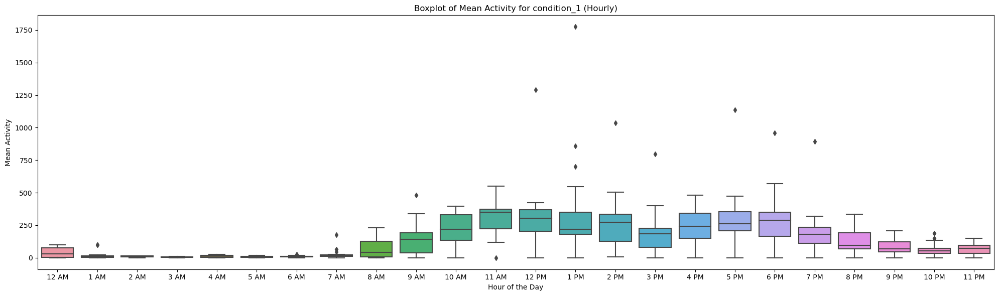

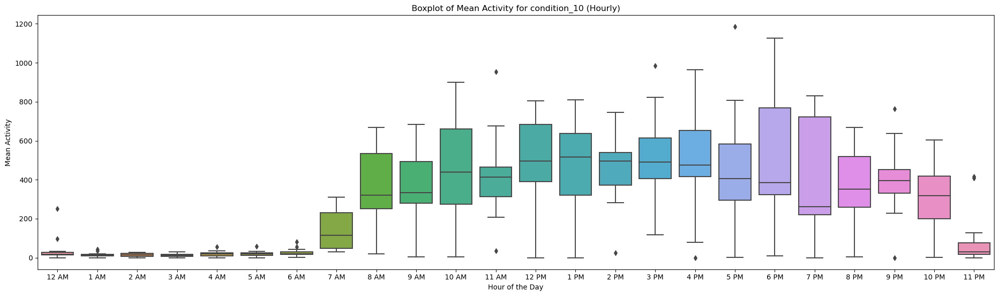

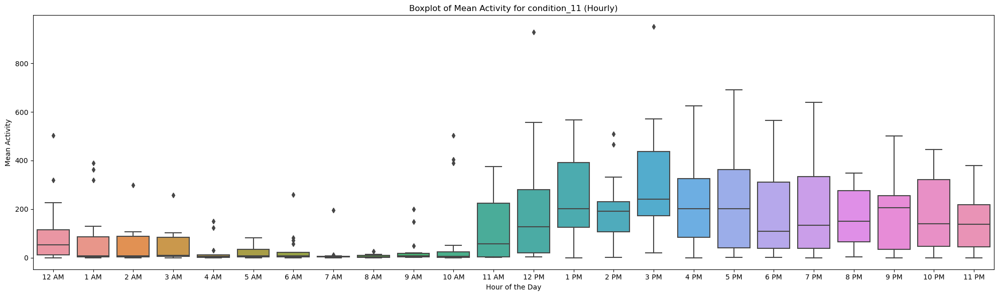

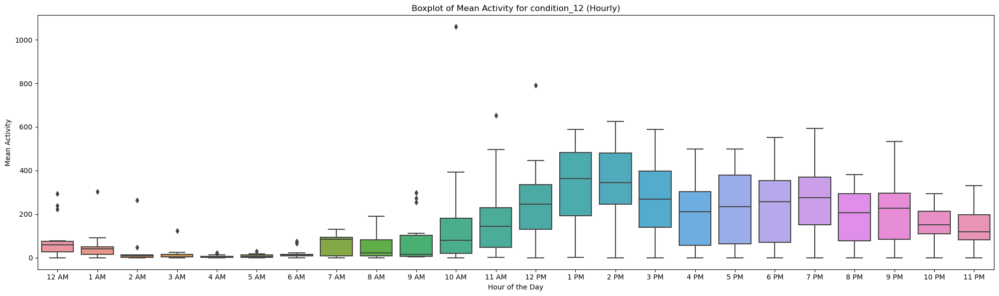

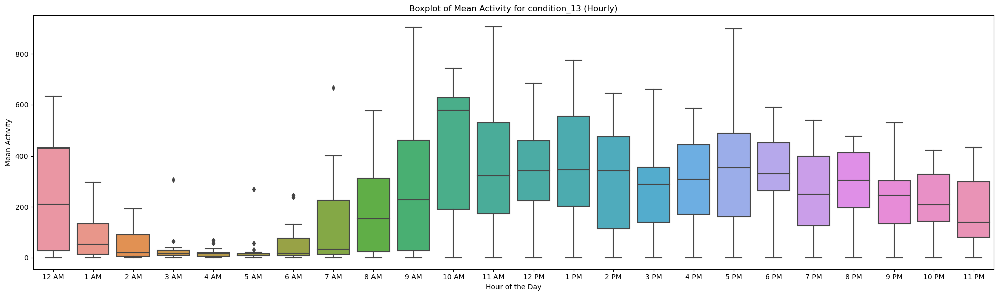

...

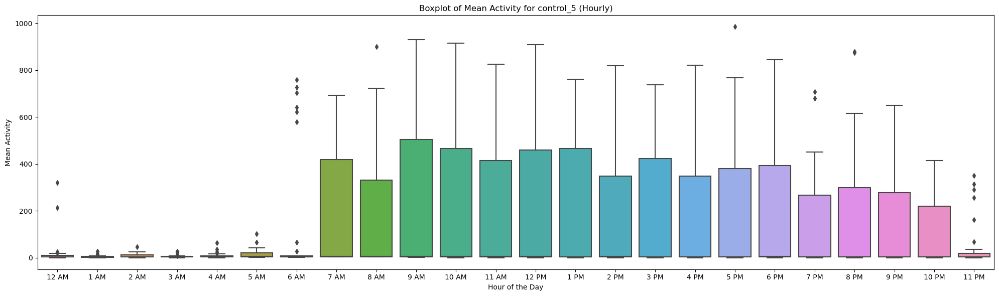

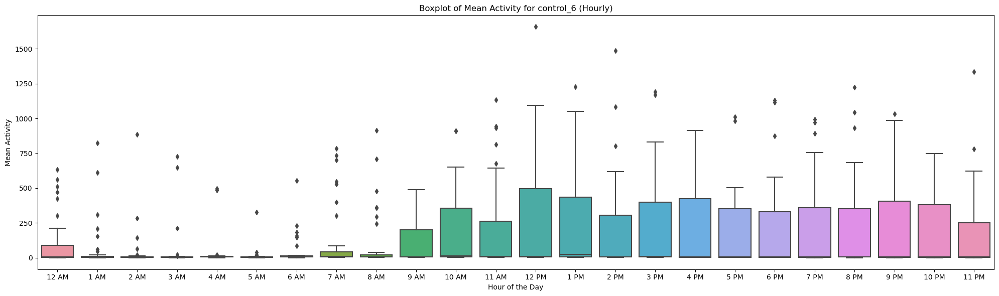

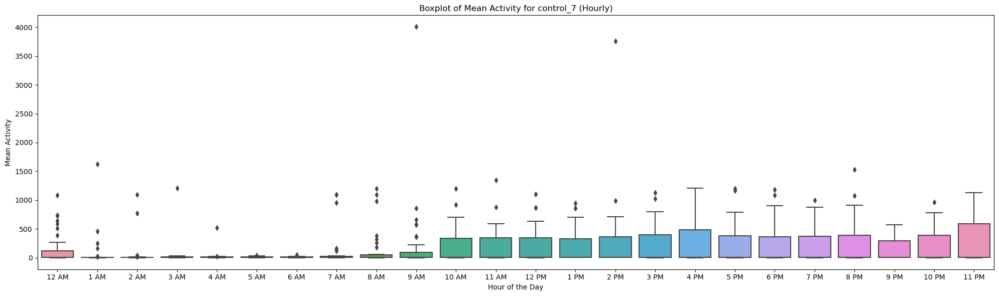

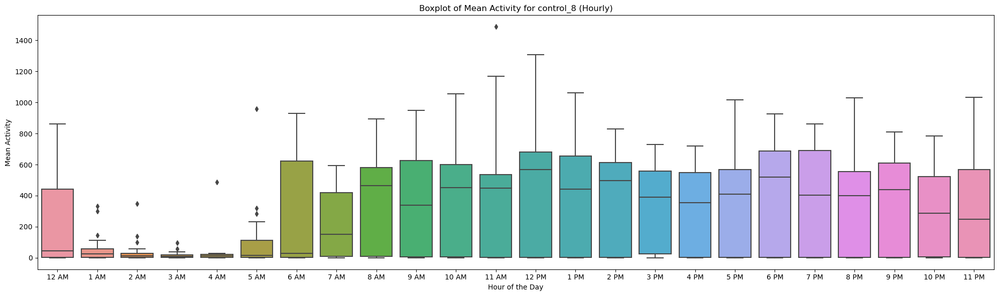

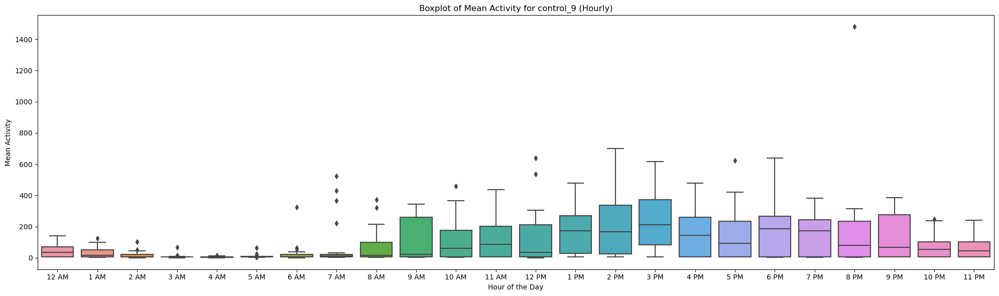

In [25]:


def plot_boxplot_hourly(df):
    # Extract hour from timestamp and create a new 'hour' column
    df['hour'] = df['timestamp'].dt.hour
    unique_persons = df['person'].unique()
    
    # Loop over each unique person to create a separate boxplot
    for person in unique_persons:
        plt.figure(figsize=(20, 6))
        person_data = df[df['person'] == person]
        
        # Use seaborn's boxplot function to plot
        sns.boxplot(data=person_data, x='hour', y='mean_activity')
        
        plt.title(f'Boxplot of Mean Activity for {person} (Hourly)')
        plt.xlabel('Hour of the Day')
        plt.ylabel('Mean Activity')
        
        # Adjust x-ticks to reflect "AM" and "PM" notation
        labels = [f"{i if i != 0 else 12} AM" for i in range(12)] + [f"{i if i != 0 else 12} PM" for i in range(12)]
        plt.xticks(ticks=range(24), labels=labels)

        
        plt.tight_layout()
        plt.show()

plot_boxplot_hourly(hourly_stats)




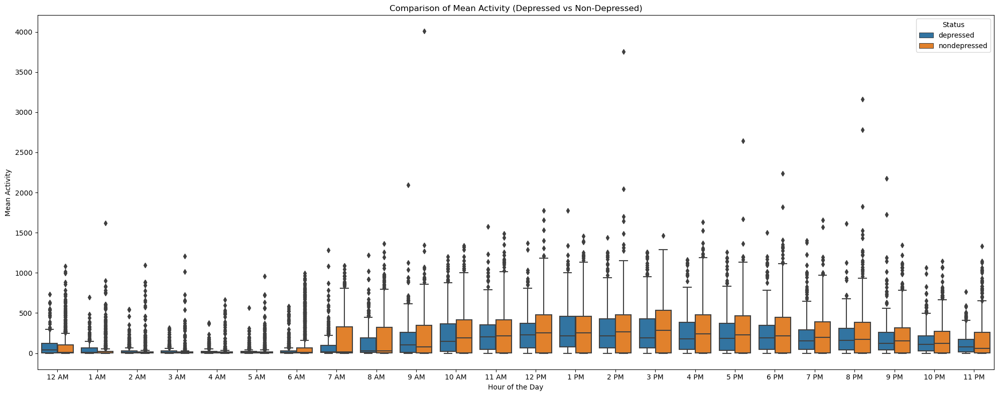

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_comparison_boxplot(df):
    
        # Extract hour from timestamp and create a new 'hour' column
    df['hour'] = df['timestamp'].dt.hour
    
    plt.figure(figsize=(20, 8))
    sns.boxplot(data=df, x='hour', y='mean_activity', hue='status')
    plt.title('Comparison of Mean Activity (Depressed vs Non-Depressed)')
    plt.xlabel('Hour of the Day')
    plt.ylabel('Mean Activity')
    
    # Adjust x-ticks to reflect "AM" and "PM" notation
    labels = [f"{i if i != 0 else 12} AM" for i in range(12)] + [f"{i if i != 0 else 12} PM" for i in range(12)]
    plt.xticks(ticks=range(24), labels=labels)

        
    plt.tight_layout()
    plt.legend(title='Status')
    plt.show()

plot_comparison_boxplot(hourly_stats)


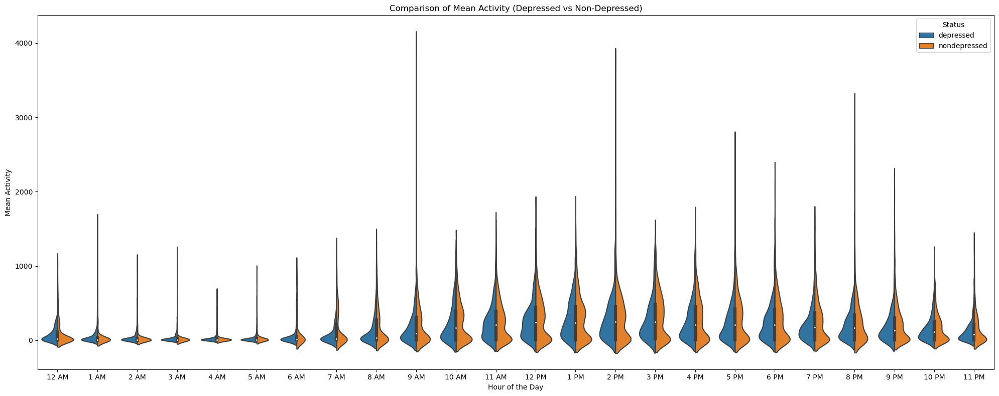

In [27]:
def plot_comparison_violinplot(df):
    
    df['hour'] = df['timestamp'].dt.hour
    plt.figure(figsize=(20, 8))
    sns.violinplot(data=df, x='hour', y='mean_activity', hue='status', split=True)
    plt.title('Comparison of Mean Activity (Depressed vs Non-Depressed)')
    plt.xlabel('Hour of the Day')
    plt.ylabel('Mean Activity')
    
    labels = [f"{i if i != 0 else 12} AM" for i in range(12)] + [f"{i if i != 0 else 12} PM" for i in range(12)]
    plt.xticks(ticks=range(24), labels=labels)

    plt.tight_layout()
    plt.legend(title='Status')
    plt.show()

plot_comparison_violinplot(hourly_stats)


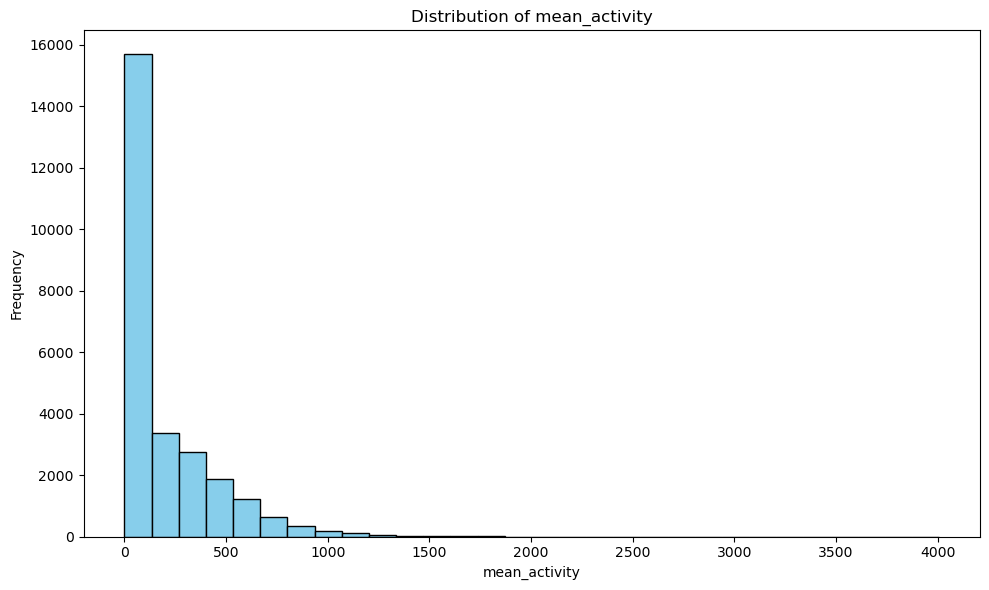

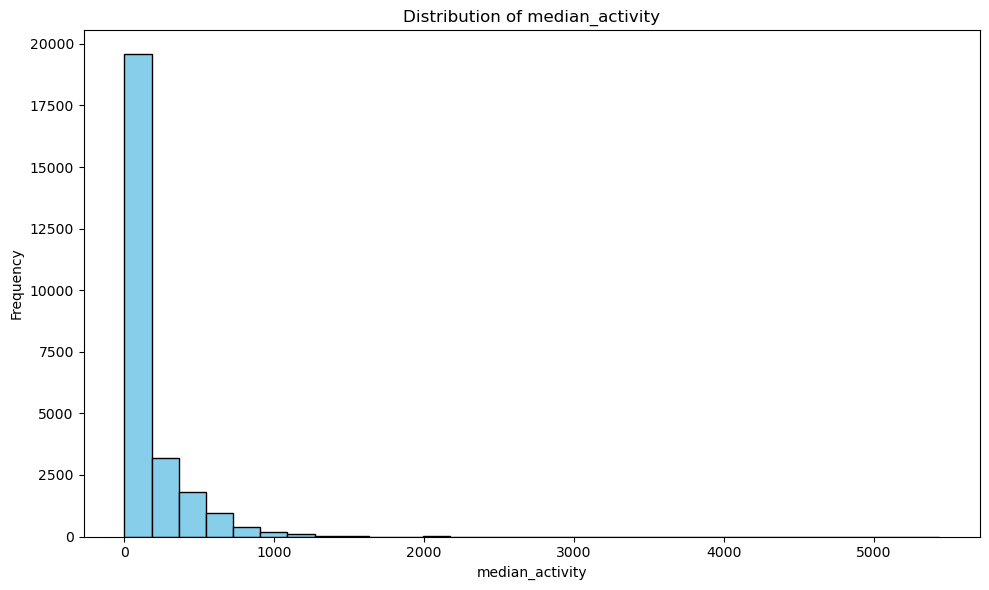

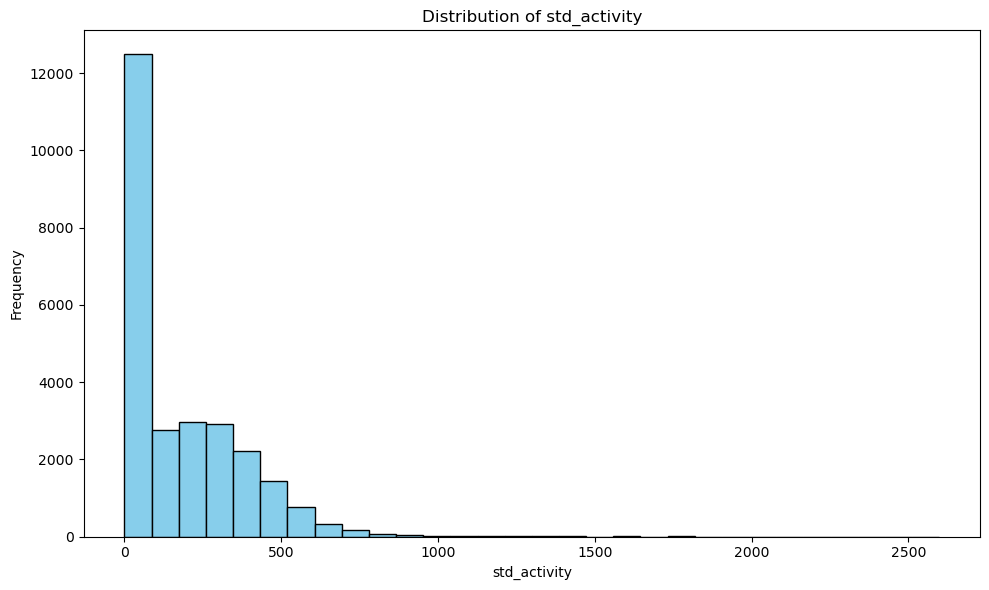

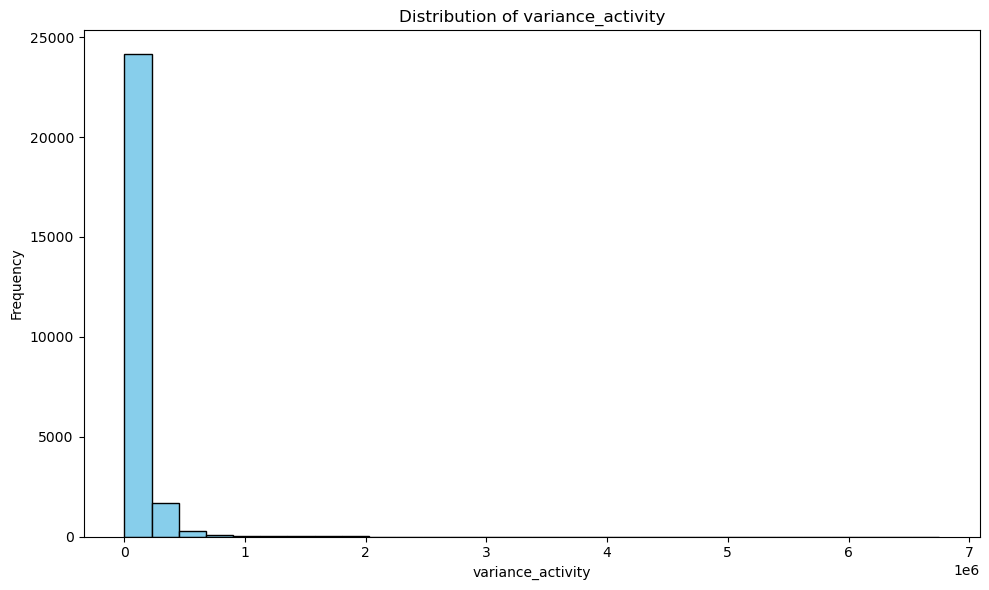

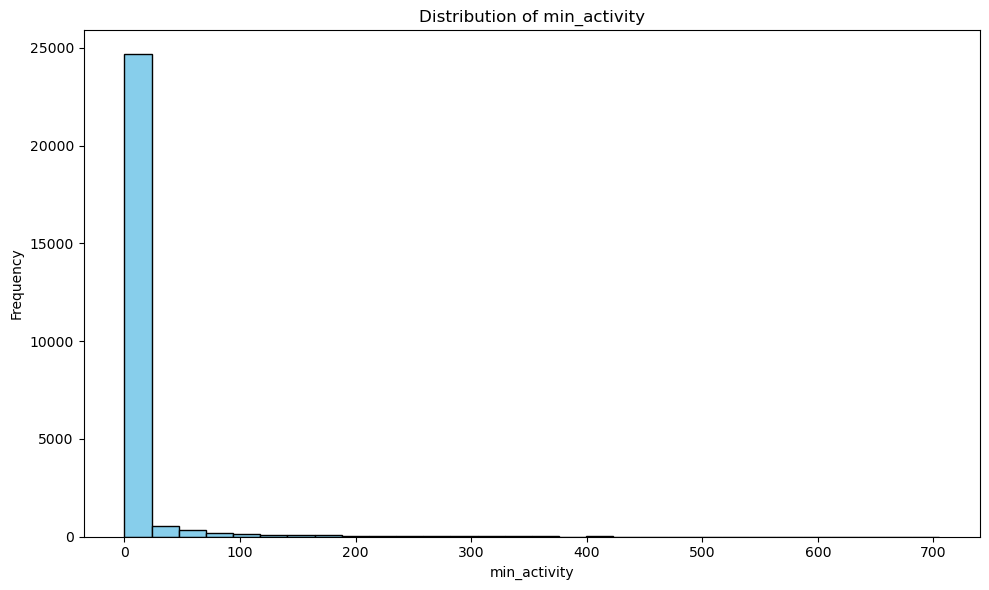

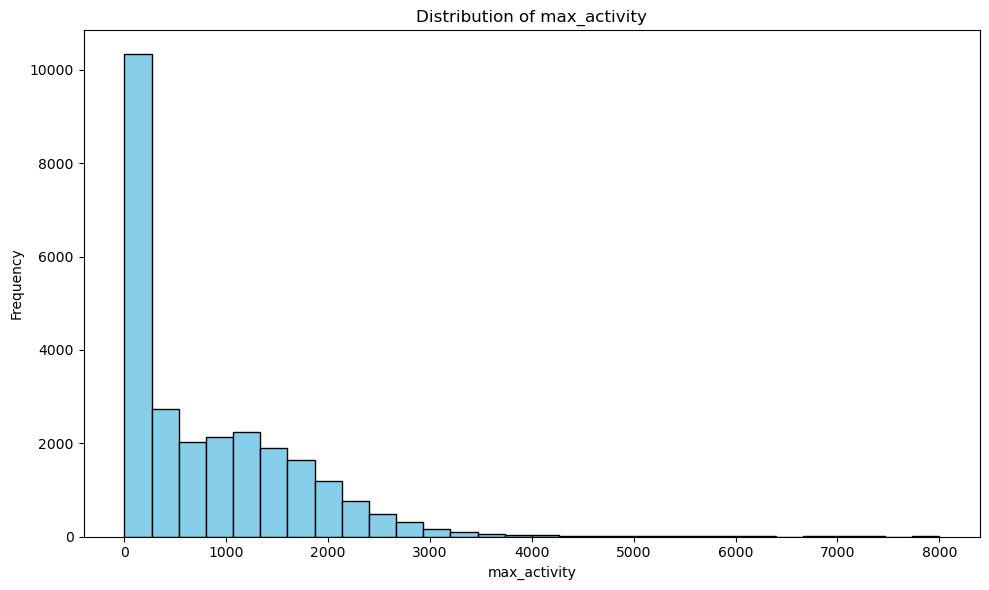

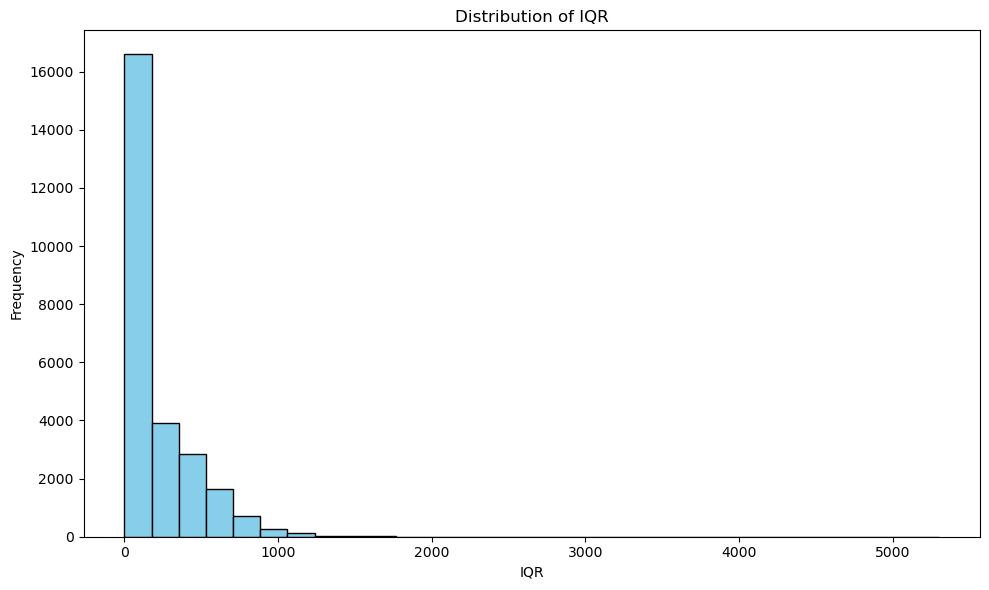

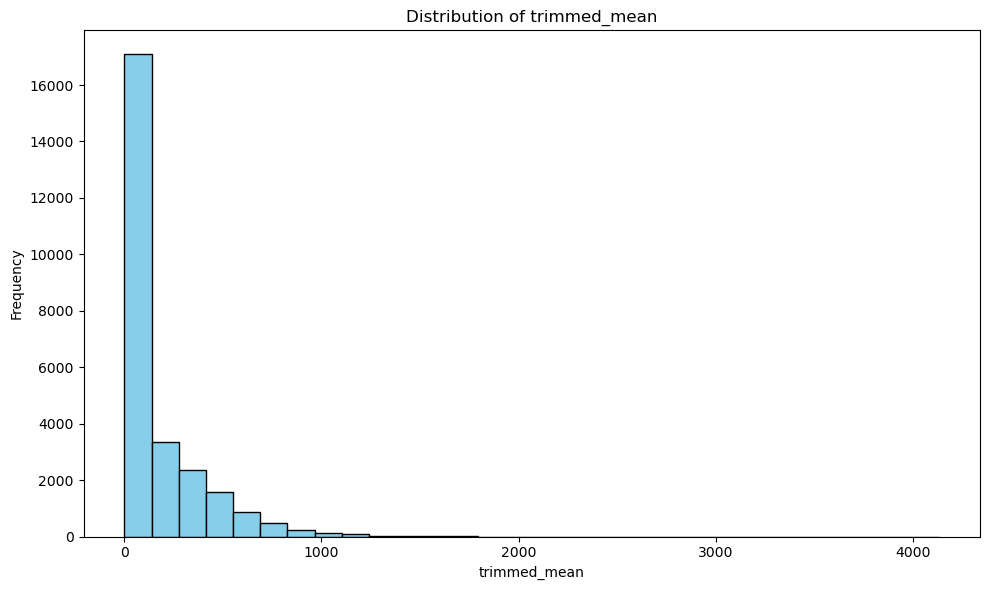

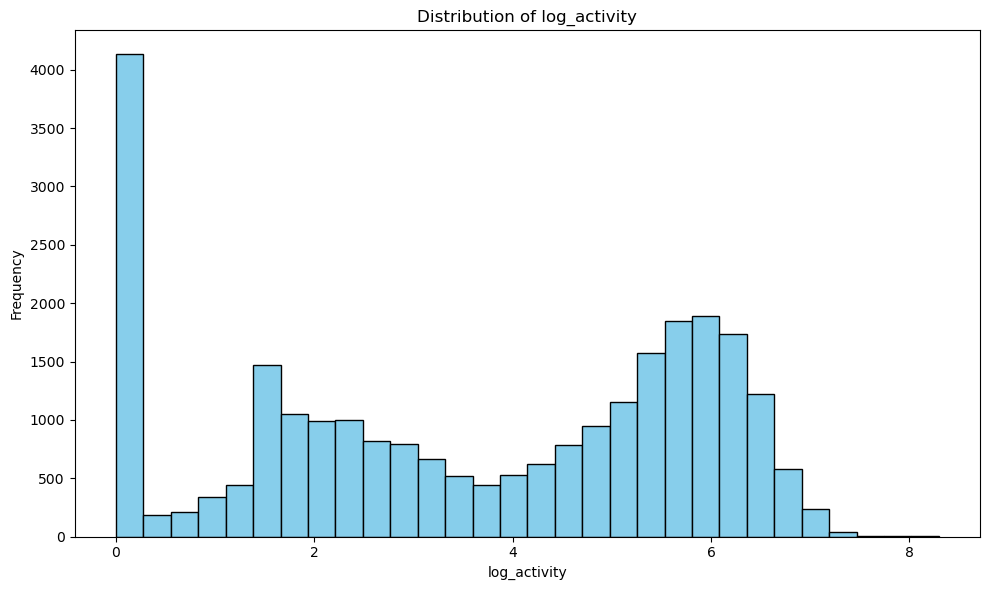

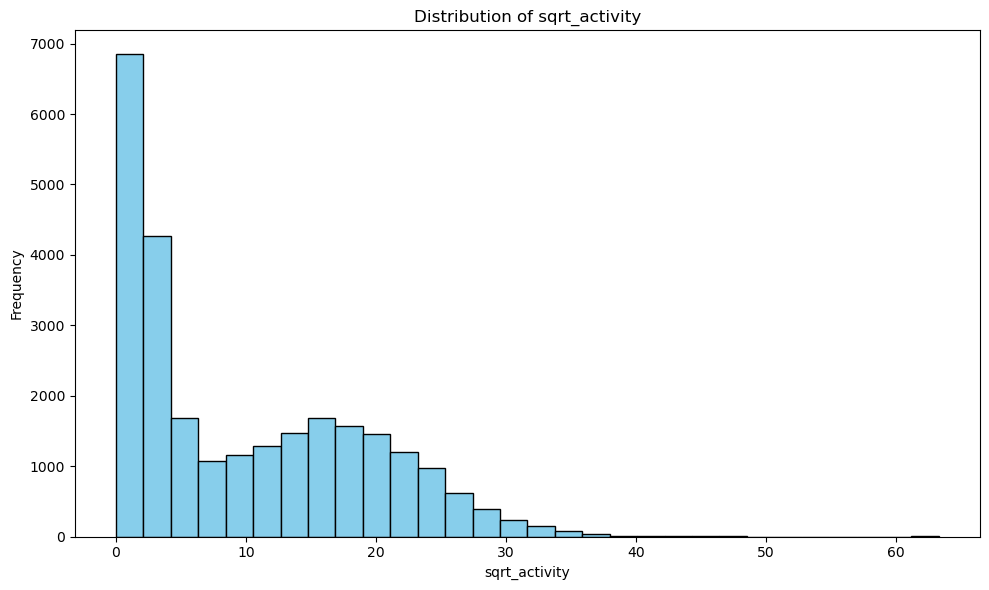

In [28]:
import matplotlib.pyplot as plt

features = ['mean_activity', 'median_activity','std_activity', 
            'variance_activity', 'min_activity', 'max_activity', 
            'IQR', 'trimmed_mean', 'log_activity', 'sqrt_activity']



for feature in features:
    plt.figure(figsize=(10, 6))
    plt.hist(hourly_stats[feature], bins=30, color='skyblue', edgecolor='black')
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()


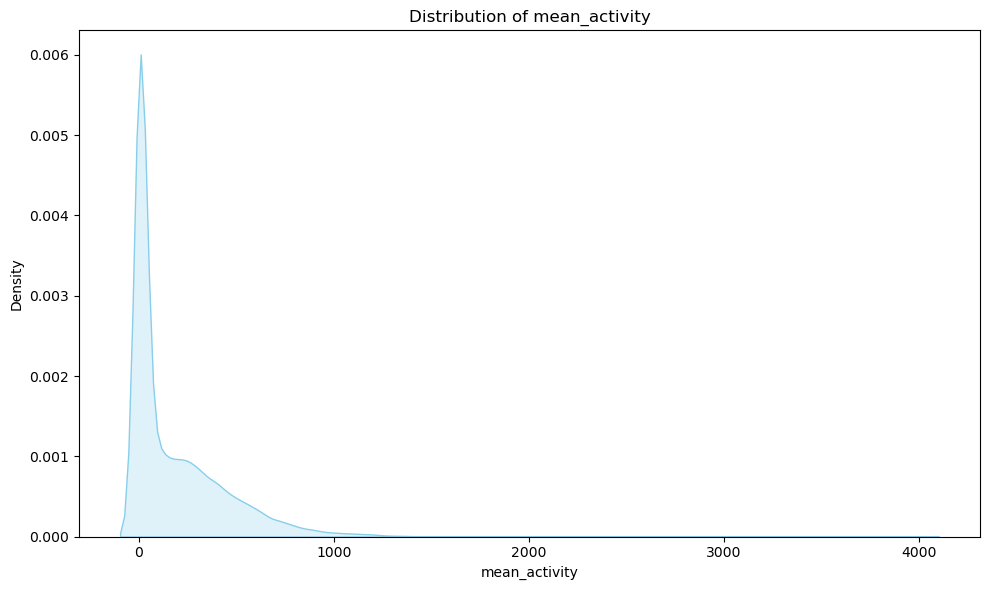

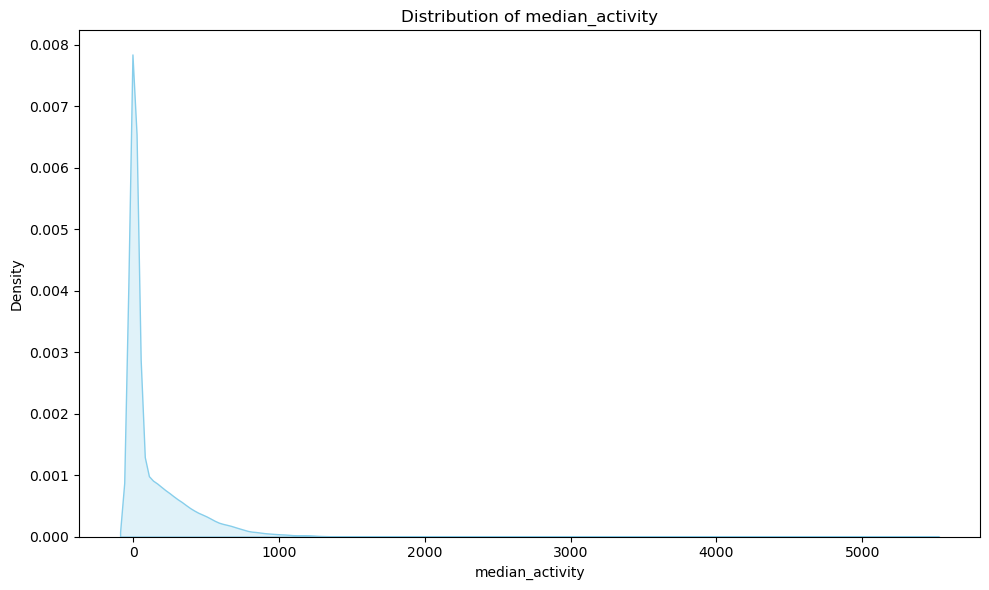

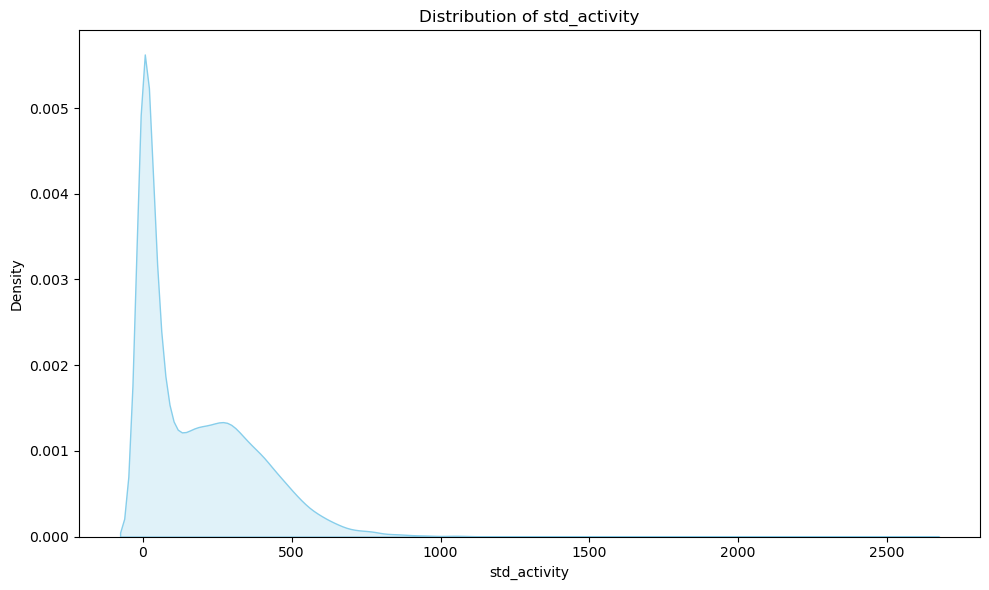

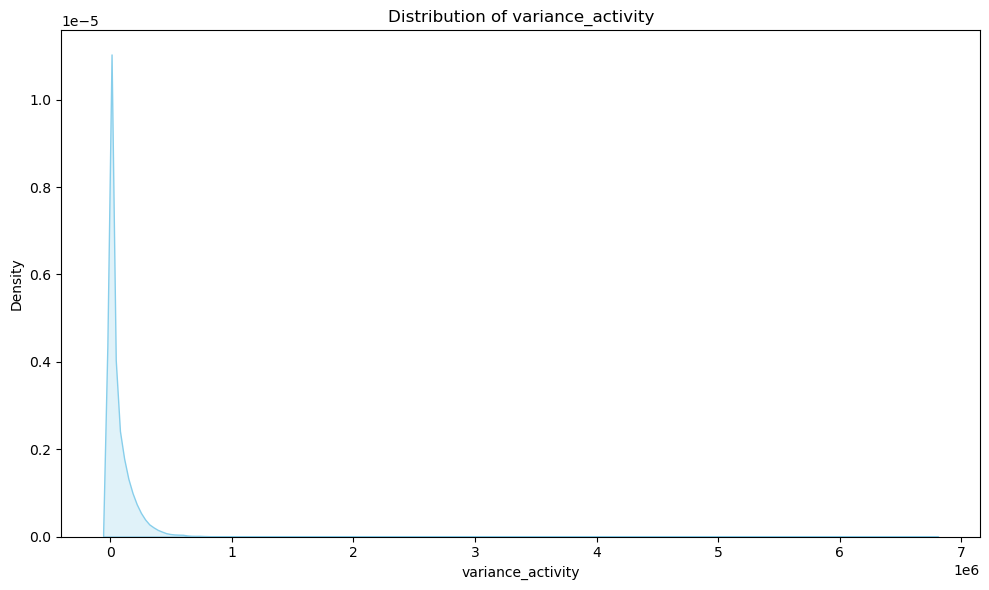

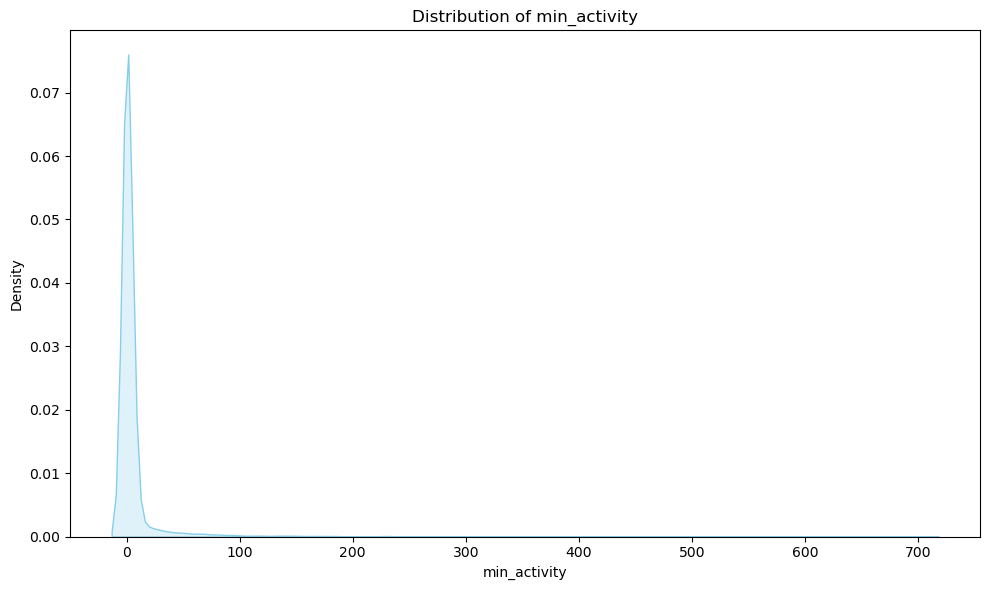

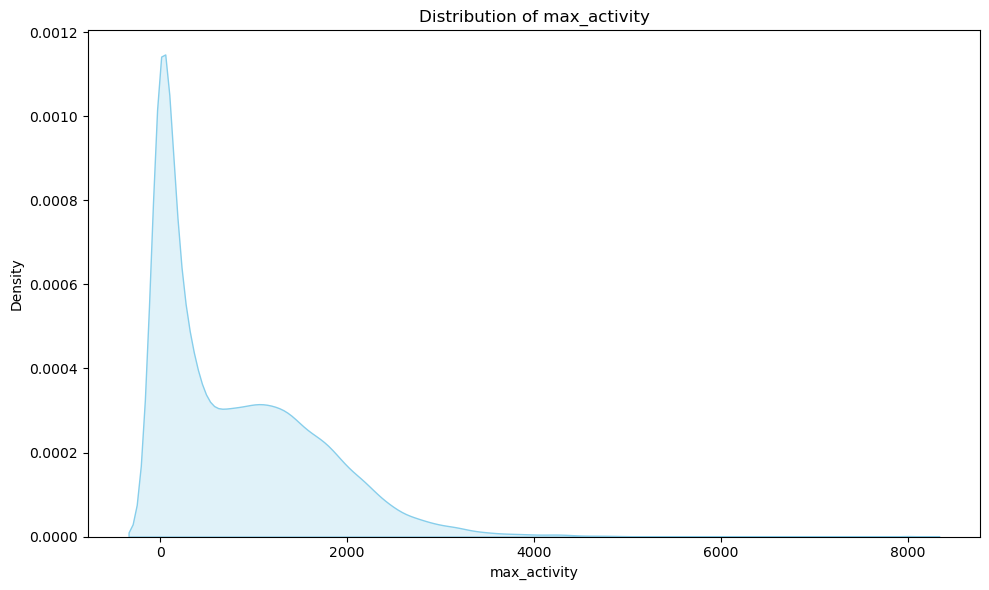

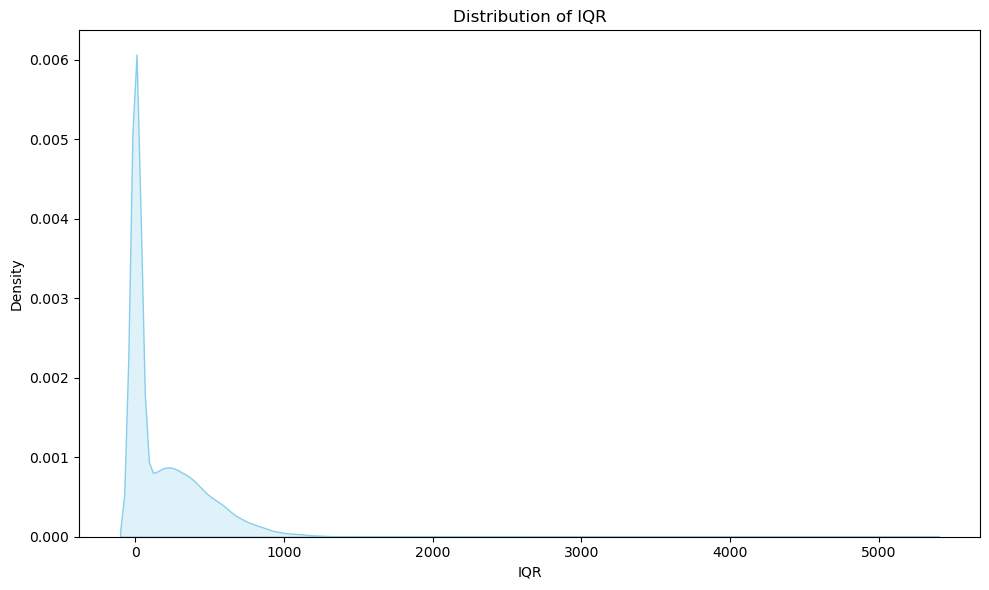

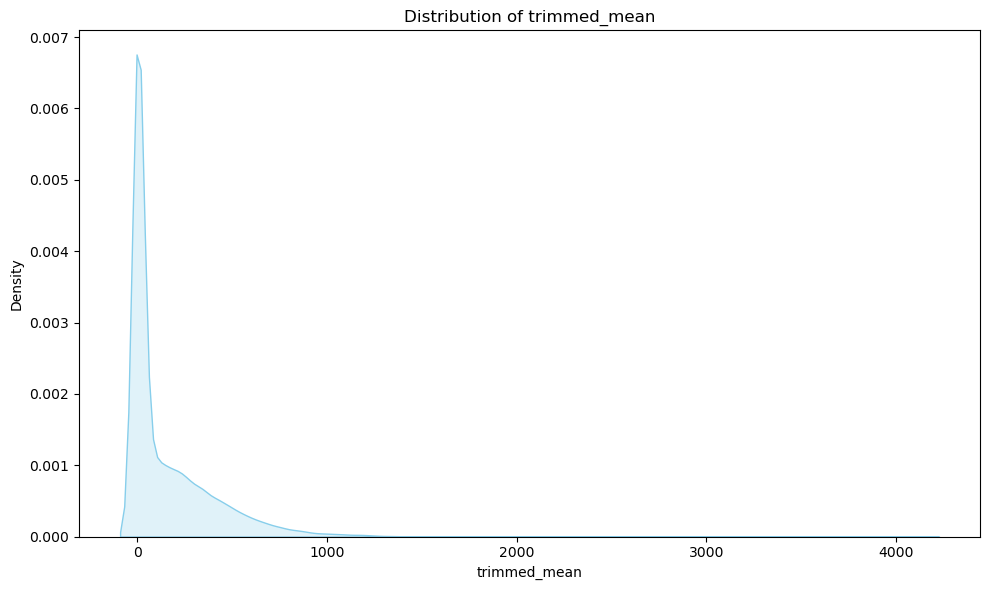

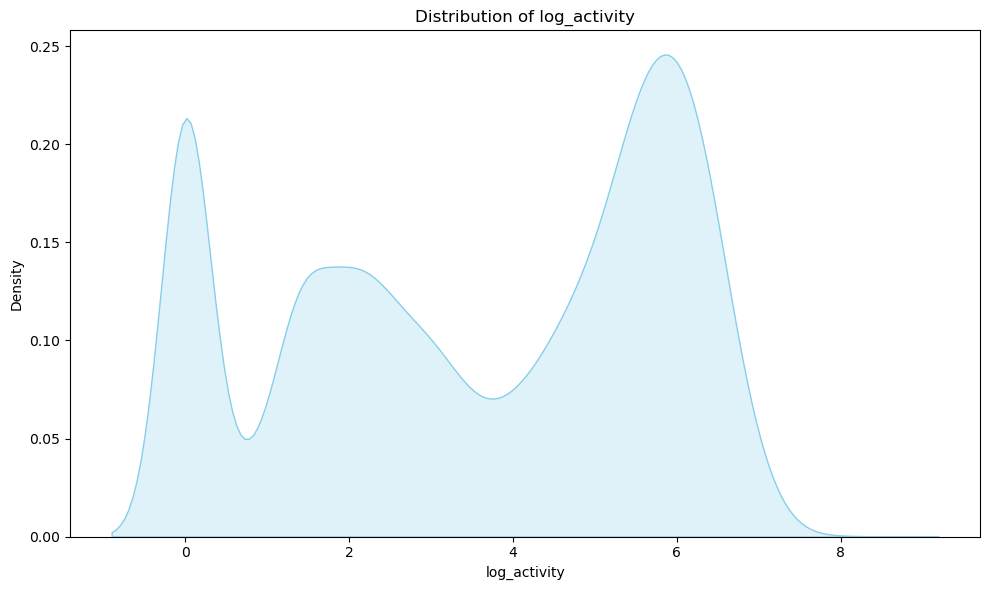

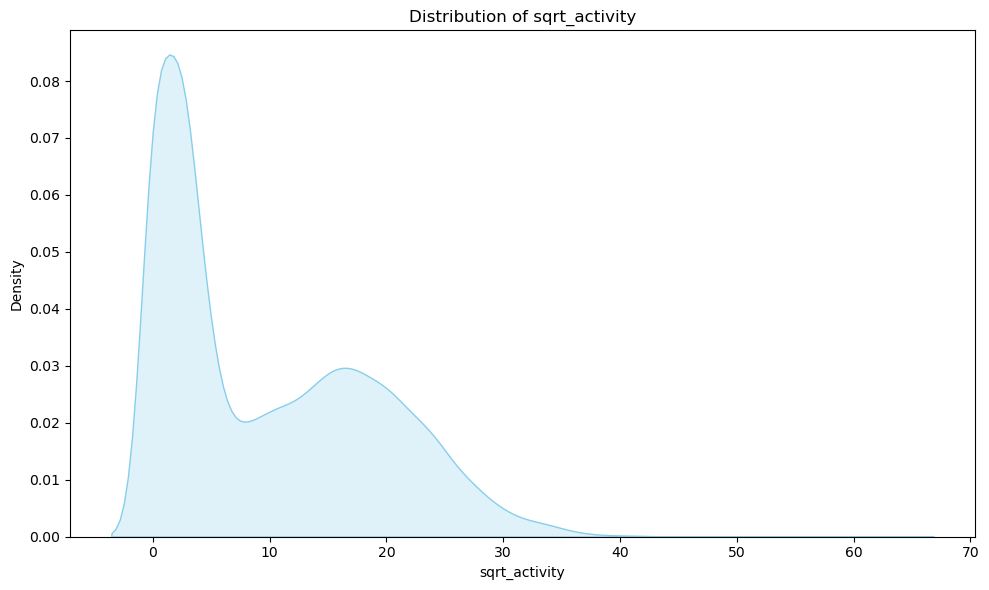

In [29]:
import seaborn as sns

for feature in features:
    plt.figure(figsize=(10, 6))
    sns.kdeplot(hourly_stats[feature], shade=True, color='skyblue')
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Density')
    plt.tight_layout()
    plt.show()


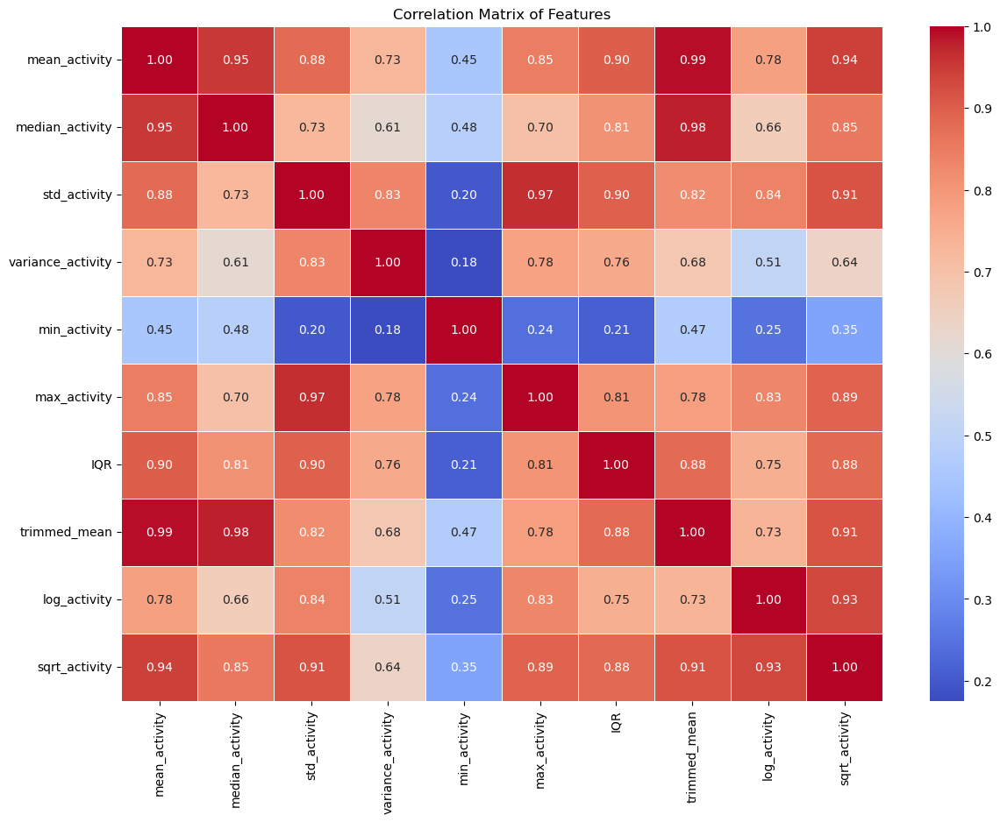

In [30]:
# Calculate the correlation matrix
corr_matrix = hourly_stats[features].corr()

# Set up the matplotlib figure
plt.figure(figsize=(14, 10))

# Generate a heatmap
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt=".2f")

# Set the title
plt.title('Correlation Matrix of Features')

# Display the heatmap
plt.show()

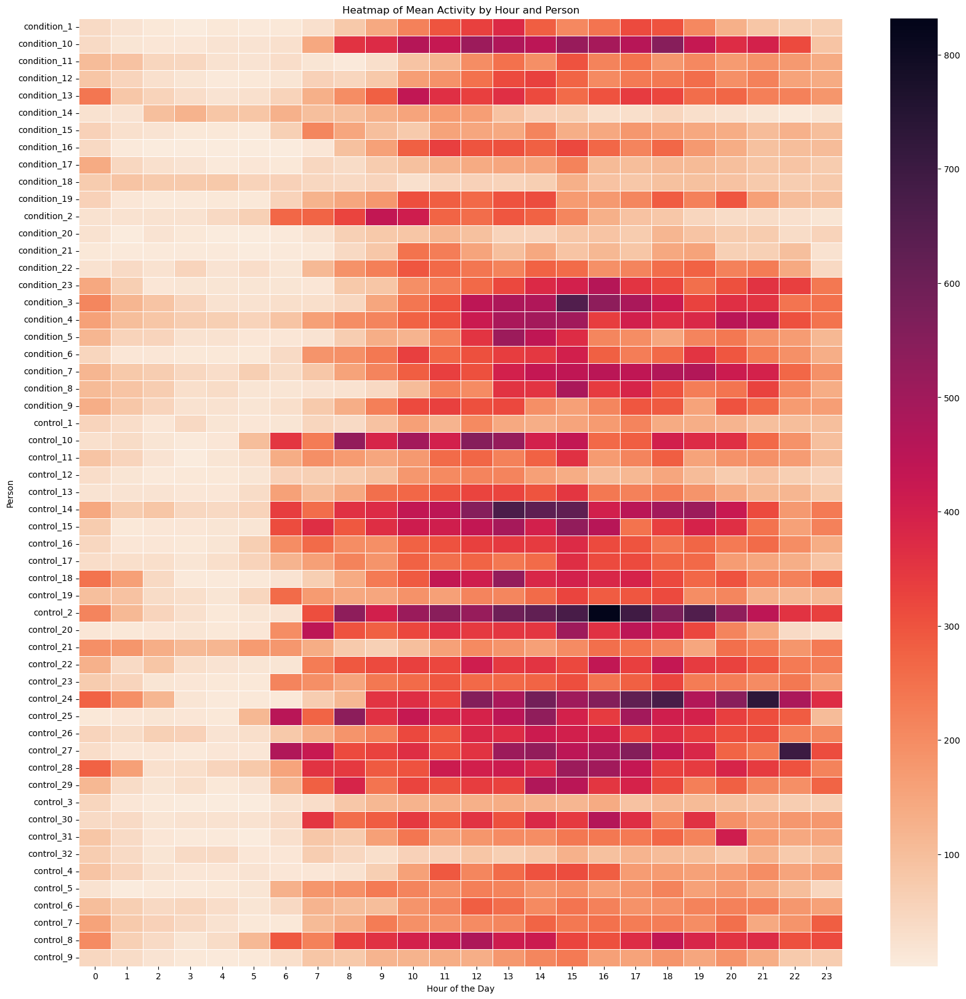

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pivot the dataframe
heatmap_data = hourly_stats.pivot_table(values='mean_activity', index='person', columns='hour', aggfunc='mean')

# Set up the matplotlib figure
plt.figure(figsize=(20, 20))

# Generate a heatmap
sns.heatmap(heatmap_data, cmap='rocket_r', linewidths=0.5)

# Set the title and axis labels
plt.title('Heatmap of Mean Activity by Hour and Person')
plt.xlabel('Hour of the Day')
plt.ylabel('Person')

# Display the heatmap
plt.show()


## DAILY DATA

In [30]:
# Define custom functions to get the hour of max and min activity
def hour_of_max_activity(x):
    return x.idxmax().hour if not x.empty else np.nan

def hour_of_min_activity(x):
    return x.idxmin().hour if not x.empty else np.nan


# Group by both 'person' and 'status', then resample into daily intervals
grouped_daily = combined_df.groupby(['person', 'status']).resample('D')['activity']

# Initialize an empty DataFrame to store the results
daily_stats = pd.DataFrame()

# Calculate the required statistical features
daily_stats['mean_activity'] = grouped_daily.mean()
daily_stats['median_activity'] = grouped_daily.median()
daily_stats['std_activity'] = grouped_daily.std()
daily_stats['variance_activity'] = grouped_daily.var()
daily_stats['min_activity'] = grouped_daily.min()
daily_stats['max_activity'] = grouped_daily.max()
daily_stats['IQR'] = grouped_daily.apply(iqr)
daily_stats['trimmed_mean'] = grouped_daily.apply(trimmed_mean_10)
daily_stats['log_activity'] = grouped_daily.mean().apply(log_activity)
daily_stats['sqrt_activity'] = grouped_daily.mean().apply(sqrt_activity)

# Calculate the hour of max and min activity for the daily data
daily_stats['hour_of_max_activity'] = grouped_daily.apply(hour_of_max_activity)
daily_stats['hour_of_min_activity'] = grouped_daily.apply(hour_of_min_activity)

daily_stats.reset_index(inplace=True)
daily_stats.head()


,person,status,timestamp,mean_activity,median_activity,std_activity,variance_activity,min_activity,max_activity,IQR,trimmed_mean,log_activity,sqrt_activity,hour_of_max_activity,hour_of_min_activity
0,condition_1,depressed,2003-05-07,174.144444,76.0,240.053885,57625.867841,0,2284,248.00,126.621528,5.165611,13.196380,23,12
1,condition_1,depressed,2003-05-08,156.247222,27.0,229.109777,52491.289777,0,1954,252.25,108.887153,5.057819,12.499889,10,0
2,condition_1,depressed,2003-05-09,124.135417,14.0,211.241278,44622.877411,0,1672,172.00,74.414062,4.829396,11.141607,12,0
3,condition_1,depressed,2003-05-10,134.961806,33.0,230.954732,53340.088186,0,2146,184.00,81.945312,4.912374,11.617306,18,0
4,condition_1,depressed,2003-05-11,99.439583,15.0,177.719972,31584.388286,0,2080,134.00,57.969618,4.609556,9.971940,23,0


In [31]:
daily_stats.isna().sum()

person                  0
status                  0
timestamp               0
mean_activity           0
median_activity         0
std_activity            0
variance_activity       0
min_activity            0
max_activity            0
IQR                     0
trimmed_mean            0
log_activity            0
sqrt_activity           0
hour_of_max_activity    0
hour_of_min_activity    0
dtype: int64

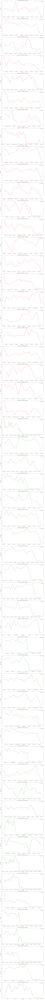

In [32]:
plot_mean_activity(daily_stats, 'Daily')

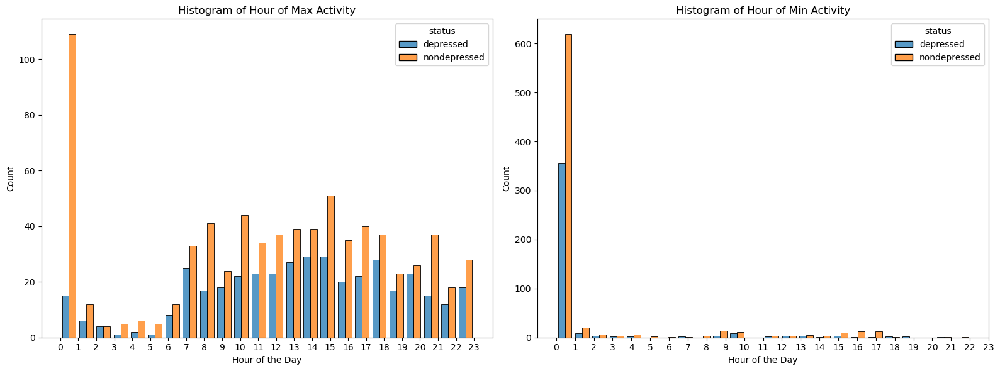

In [33]:
import seaborn as sns

def plot_distinguishable_histogram_max_min_activity_hour(df):
    plt.figure(figsize=(16, 6))
    
    # Plotting the histogram for the hour of maximum activity
    plt.subplot(1, 2, 1)
    sns.histplot(data=df, x='hour_of_max_activity', hue='status', bins=24, multiple="dodge", shrink=.8)
    plt.title('Histogram of Hour of Max Activity')
    plt.xlabel('Hour of the Day')
    plt.ylabel('Count')
    plt.xticks(range(24))
    
    # Plotting the histogram for the hour of minimum activity
    plt.subplot(1, 2, 2)
    sns.histplot(data=df, x='hour_of_min_activity', hue='status', bins=24, multiple="dodge", shrink=.8)
    plt.title('Histogram of Hour of Min Activity')
    plt.xlabel('Hour of the Day')
    plt.ylabel('Count')
    plt.xticks(range(24))
    
    plt.tight_layout()
    plt.show()

plot_distinguishable_histogram_max_min_activity_hour(daily_stats)


# MODELING

##  RANDOM FOREST ON DAILY DATA

In [34]:
daily_stats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1144 entries, 0 to 1143
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   person                1144 non-null   object        
 1   status                1144 non-null   object        
 2   timestamp             1144 non-null   datetime64[ns]
 3   mean_activity         1144 non-null   float64       
 4   median_activity       1144 non-null   float64       
 5   std_activity          1144 non-null   float64       
 6   variance_activity     1144 non-null   float64       
 7   min_activity          1144 non-null   int64         
 8   max_activity          1144 non-null   int64         
 9   IQR                   1144 non-null   float64       
 10  trimmed_mean          1144 non-null   float64       
 11  log_activity          1144 non-null   float64       
 12  sqrt_activity         1144 non-null   float64       
 13  hour_of_max_activi

In [35]:
daily_stats = daily_stats.sort_values(by=['person', 'timestamp'])


In [9]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier

#  Find the Best Parameters using Randomized Search

# Define the parameters to search
param_dist = {
    'n_estimators': [50, 100, 300],
    'max_features': ['sqrt', 'log2'],
    'max_depth': [None, 10, 30],
    'min_samples_split': [2, 10],
    'min_samples_leaf': [1, 4],
    'bootstrap': [True, False]
}

# Initialize Random Forest Classifier
rf = RandomForestClassifier()

# Initialize RandomizedSearchCV
rf_random_search = RandomizedSearchCV(rf, param_distributions=param_dist, n_iter=100, cv=5, verbose=2, random_state=42, n_jobs=-1)

# Fit the model
X = daily_stats.drop(columns=['status', 'person', 'timestamp'])  # drop non-numeric columns
y = daily_stats['status']

rf_random_search.fit(X, y)

# Best parameters
best_params = rf_random_search.best_params_


NameError: name 'daily_stats' is not defined

In [37]:
print(best_params)

{'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'log2', 'max_depth': None, 'bootstrap': True}


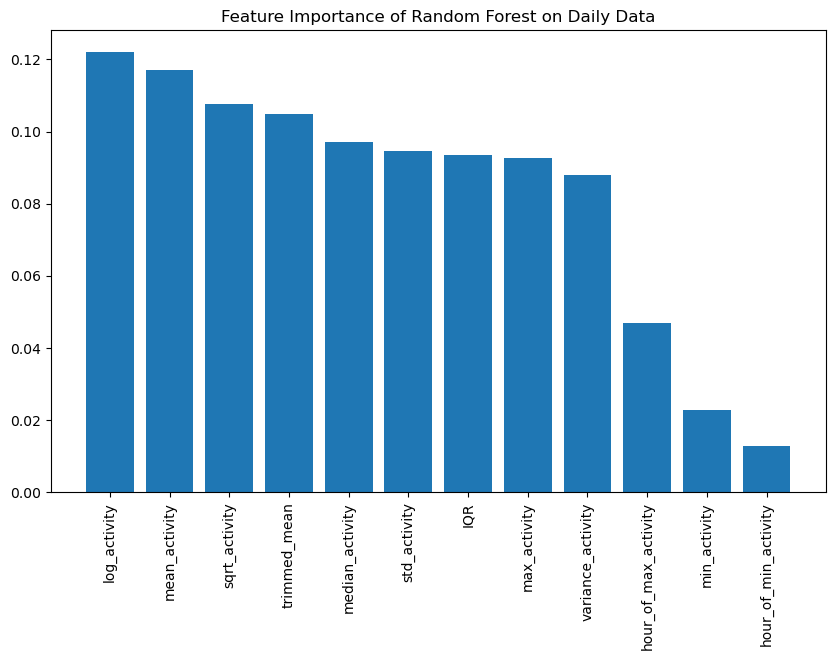

In [38]:
# Find the Order of Importance of Features


# Get feature importances from the best estimator
importances = rf_random_search.best_estimator_.feature_importances_

# Sort feature importances in descending order and get the indices
indices = np.argsort(importances)[::-1]

# Rearrange feature names so they match the sorted importances
names = [X.columns[i] for i in indices]

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.title("Feature Importance of Random Forest on Daily Data")
plt.bar(range(X.shape[1]), importances[indices])
plt.xticks(range(X.shape[1]), names, rotation=90)
plt.show()



In [39]:
# Run the Model & Metrics

from sklearn.metrics import classification_report, matthews_corrcoef, cohen_kappa_score
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_random_search.fit(X_train, y_train)
y_pred = rf_random_search.predict(X_test)

print(classification_report(y_test, y_pred))
print("MCC (RF on Daily Data):", matthews_corrcoef(y_test, y_pred))
print("Cohen Kappa(RF on Daily Data):", cohen_kappa_score(y_test, y_pred))


Fitting 5 folds for each of 100 candidates, totalling 500 fits
              precision    recall  f1-score   support

   depressed       0.73      0.48      0.58        89
nondepressed       0.73      0.89      0.80       140

    accuracy                           0.73       229
   macro avg       0.73      0.68      0.69       229
weighted avg       0.73      0.73      0.71       229

MCC (RF on Daily Data): 0.41112182480872167
Cohen Kappa(RF on Daily Data): 0.39298845660538695


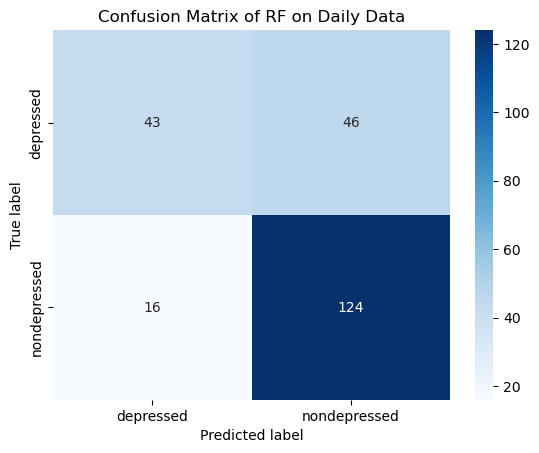

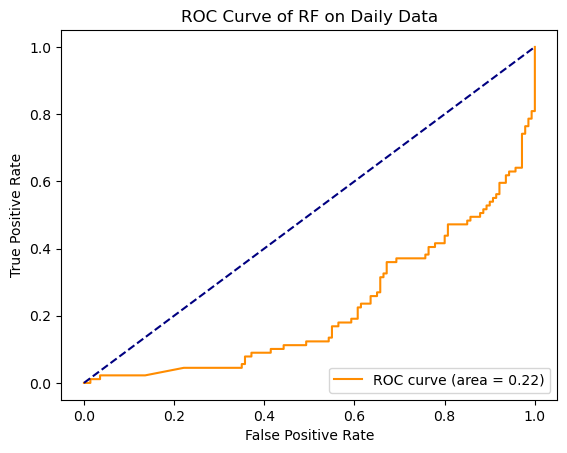

In [40]:
# Visualize Confusion Matrix & ROC_AUC Curve

from sklearn.metrics import confusion_matrix, roc_curve, auc
import seaborn as sns

# Confusion Matrix

conf_matrix = confusion_matrix(y_test, y_pred, labels=['depressed', 'nondepressed'])
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['depressed', 'nondepressed'], 
            yticklabels=['depressed', 'nondepressed'])
plt.title('Confusion Matrix of RF on Daily Data')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

# ROC_AUC Curve
y_prob = rf_random_search.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_prob, pos_label='depressed')  # adjust pos_label if necessary
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of RF on Daily Data')
plt.legend(loc="lower right")
plt.show()


In [41]:
daily_stats.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1144 entries, 0 to 1143
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   person                1144 non-null   object        
 1   status                1144 non-null   object        
 2   timestamp             1144 non-null   datetime64[ns]
 3   mean_activity         1144 non-null   float64       
 4   median_activity       1144 non-null   float64       
 5   std_activity          1144 non-null   float64       
 6   variance_activity     1144 non-null   float64       
 7   min_activity          1144 non-null   int64         
 8   max_activity          1144 non-null   int64         
 9   IQR                   1144 non-null   float64       
 10  trimmed_mean          1144 non-null   float64       
 11  log_activity          1144 non-null   float64       
 12  sqrt_activity         1144 non-null   float64       
 13  hour_of_max_activi

## MODIFIED LOOCV WITH RF ON DAILY DATA

In [42]:
# Modified LOOCV with Randomized Search:


# Classifier and parameter space for limited search
clf = RandomForestClassifier()

param_dist = {
    'n_estimators': [50, 100, 300],
    'max_features': ['sqrt', 'log2'],
    'max_depth': [None, 10, 30],
    'min_samples_split': [2, 10],
    'min_samples_leaf': [1, 4],
    'bootstrap': [True, False]
}

overall_results = []
feature_importances = []
all_true_labels = []
all_predicted_probs = []
all_predicted_labels = []


depressed_participants = daily_stats[daily_stats['status'] == 'depressed']['person'].unique().tolist()
non_depressed_participants = daily_stats[daily_stats['status'] == 'nondepressed']['person'].unique().tolist()


for depressed_participant in depressed_participants:
    non_depressed_participant = np.random.choice(non_depressed_participants)
    
    # Extract test set for a pair of depressed and non-depressed participants
    test_data = daily_stats[(daily_stats['person'] == depressed_participant) | 
                            (daily_stats['person'] == non_depressed_participant)]
    
    # Everything else is used for training
    train_data = daily_stats[(daily_stats['person'] != depressed_participant) & 
                             (daily_stats['person'] != non_depressed_participant)]
    
    X_train = train_data.drop(columns=['person', 'status', 'timestamp'])
    y_train = train_data['status']
    
    X_test = test_data.drop(columns=['person', 'status', 'timestamp'])
    y_test = test_data['status']
    
   # Limited Randomized Search
    random_search = RandomizedSearchCV(clf, param_distributions=param_dist, n_iter=10, cv=10, n_jobs=-1)
    random_search.fit(X_train, y_train)
    
    best_rf = random_search.best_estimator_
    
    # Metrics
    current_predicted_labels = best_rf.predict(X_test) # Rename to current_predicted_labels
    all_predicted_labels.extend(current_predicted_labels) # Extend the all_predicted_labels list
    
    report = classification_report(y_test, current_predicted_labels, output_dict=True)
    mcc = matthews_corrcoef(y_test, current_predicted_labels)
    kappa = cohen_kappa_score(y_test, current_predicted_labels)
    auc_score = roc_auc_score(y_test, best_rf.predict_proba(X_test)[:,1])
    
    overall_results.append({'report': report, 'mcc': mcc, 'kappa': kappa, 'auc': auc_score})
    feature_importances.append(best_rf.feature_importances_)
    
    all_true_labels.extend(y_test)
    all_predicted_probs.extend(best_rf.predict_proba(X_test)[:, 1])



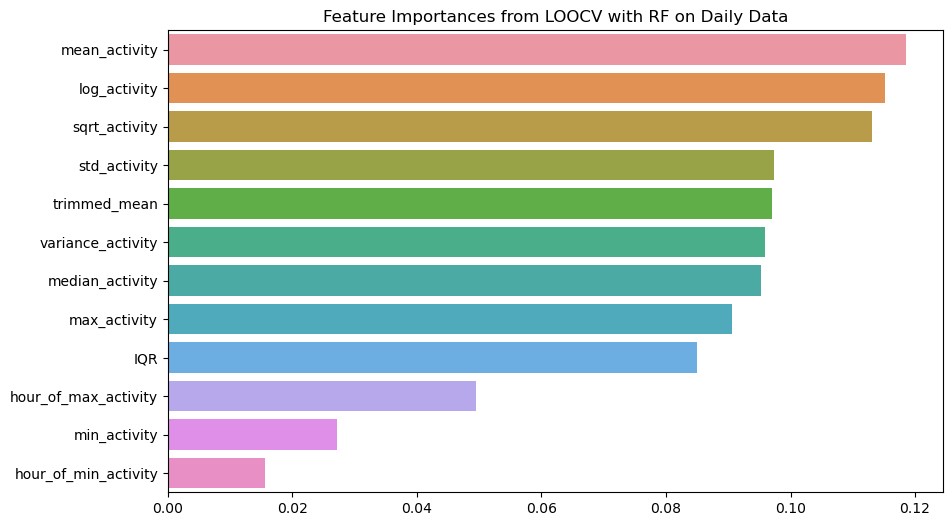

In [43]:
# Feature Importances
mean_importances = np.mean(feature_importances, axis=0)

# Get the sorted indices
sorted_indices = np.argsort(mean_importances)[::-1]

plt.figure(figsize=(10, 6))
sns.barplot(x=mean_importances[sorted_indices], y=X_train.columns[sorted_indices])
plt.title('Feature Importances from LOOCV with RF on Daily Data')
plt.show()


In [44]:
from sklearn.metrics import classification_report

# Using the earlier created predicted labels
print(classification_report(all_true_labels, all_predicted_labels))


              precision    recall  f1-score   support

   depressed       0.63      0.42      0.51       405
nondepressed       0.65      0.81      0.72       531

    accuracy                           0.64       936
   macro avg       0.64      0.62      0.61       936
weighted avg       0.64      0.64      0.63       936



In [45]:
# Average Metrics
avg_mcc = np.mean([result['mcc'] for result in overall_results])
avg_kappa = np.mean([result['kappa'] for result in overall_results])
print(f"Average MCC(LOOCV with RF on Daily Data): {avg_mcc}")
print(f"Average Kappa(LOOCV with RF on Daily Data: {avg_kappa}")

Average MCC(LOOCV with RF on Daily Data): 0.263218818869073
Average Kappa(LOOCV with RF on Daily Data: 0.23628408291208847


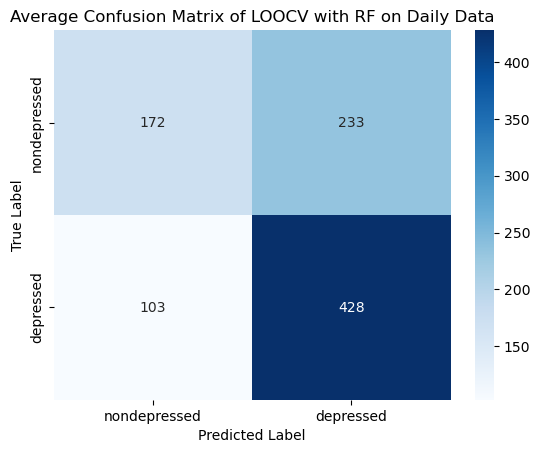

In [46]:
# Confusion Matrix
predicted_labels = ['depressed' if prob > 0.5 else 'nondepressed' for prob in all_predicted_probs]

# Confusion Matrix
avg_confusion = confusion_matrix(all_true_labels, all_predicted_labels)
sns.heatmap(avg_confusion, annot=True, cmap="Blues", fmt="g", xticklabels=['nondepressed', 'depressed'], yticklabels=['nondepressed', 'depressed'])
plt.title('Average Confusion Matrix of LOOCV with RF on Daily Data')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


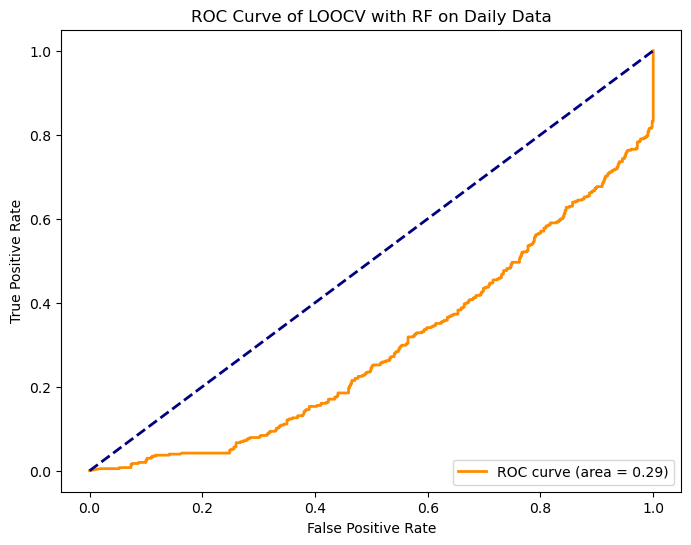

In [47]:
# ROC AUC
fpr, tpr, _ = roc_curve(all_true_labels, all_predicted_probs, pos_label='depressed')
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of LOOCV with RF on Daily Data')
plt.legend(loc="lower right")
plt.show()

## RANDOM FOREST ON HOURLY DATA

In [7]:
hourly_stats = hourly_stats.sort_values(by=['person', 'timestamp'])


In [49]:
hourly_stats.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26235 entries, 0 to 26234
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   person             26235 non-null  object        
 1   status             26235 non-null  object        
 2   timestamp          26235 non-null  datetime64[ns]
 3   mean_activity      26235 non-null  float64       
 4   median_activity    26235 non-null  float64       
 5   std_activity       26235 non-null  float64       
 6   variance_activity  26235 non-null  float64       
 7   min_activity       26235 non-null  float64       
 8   max_activity       26235 non-null  float64       
 9   IQR                26235 non-null  float64       
 10  trimmed_mean       26235 non-null  float64       
 11  log_activity       26235 non-null  float64       
 12  sqrt_activity      26235 non-null  float64       
 13  hour               26235 non-null  int64         
dtypes: dat

In [10]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
# Define the parameters to search
param_dist = {
    'n_estimators': [50, 100, 300],
    'max_features': ['sqrt', 'log2'],
    'max_depth': [None, 10, 30],
    'min_samples_split': [2, 10],
    'min_samples_leaf': [1, 4],
    'bootstrap': [True, False]
}

# Initialize Random Forest Classifier
rf = RandomForestClassifier()

# Initialize RandomizedSearchCV
rf_random_search = RandomizedSearchCV(rf, param_distributions=param_dist, n_iter=100, cv=5, verbose=2, random_state=42, n_jobs=-1)

# Fit the model
X = hourly_stats.drop(columns=['status', 'person', 'timestamp'])  # drop non-numeric columns
y = hourly_stats['status']

rf_random_search.fit(X, y)

# Best parameters
best_params = rf_random_search.best_params_

Fitting 5 folds for each of 100 candidates, totalling 500 fits


KeyboardInterrupt: 

In [51]:
print(best_params)

{'n_estimators': 300, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 10, 'bootstrap': False}


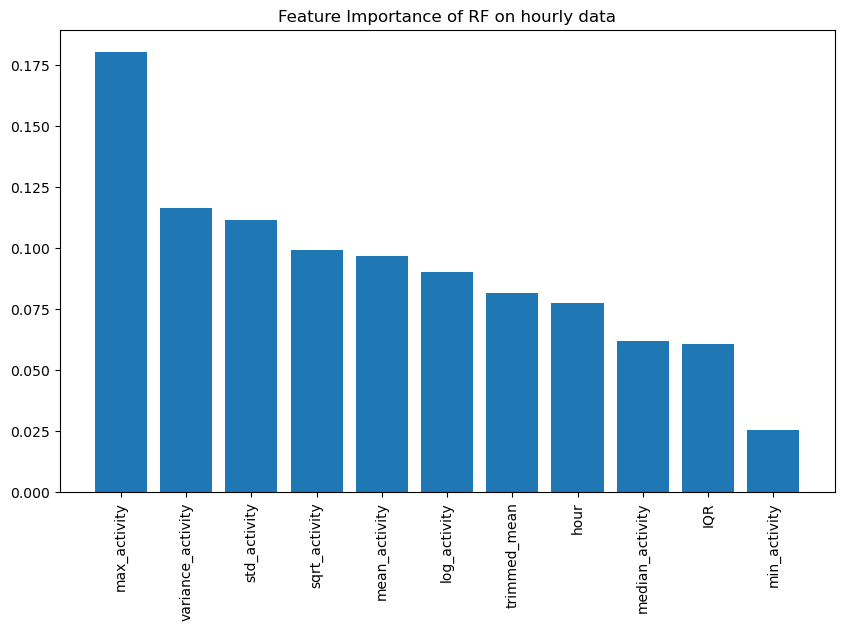

In [52]:
# Find the Order of Importance of Features


# Use the best estimator from the RandomizedSearchCV
best_rf = rf_random_search.best_estimator_

# Get feature importances
importances = best_rf.feature_importances_

# Sort feature importances in descending order and get the indices
indices = np.argsort(importances)[::-1]

# Rearrange feature names so they match the sorted importances
names = [X.columns[i] for i in indices]

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.title("Feature Importance of RF on hourly data")
plt.bar(range(X.shape[1]), importances[indices])
plt.xticks(range(X.shape[1]), names, rotation=90)
plt.show()


In [54]:
# Run the Model & Metrics

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

best_rf.fit(X_train, y_train)
y_pred = best_rf.predict(X_test)

print(classification_report(y_test, y_pred))
print("MCC (RF on hourly data):", matthews_corrcoef(y_test, y_pred))
print("Cohen Kappa(RF hourly data):", cohen_kappa_score(y_test, y_pred))


              precision    recall  f1-score   support

   depressed       0.62      0.40      0.49      1848
nondepressed       0.73      0.87      0.79      3399

    accuracy                           0.70      5247
   macro avg       0.68      0.63      0.64      5247
weighted avg       0.69      0.70      0.68      5247

MCC (RF on hourly data): 0.307020347672547
Cohen Kappa(RF hourly data): 0.29281993930570527


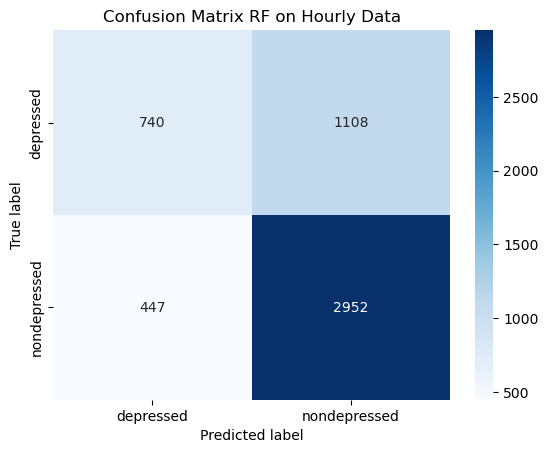

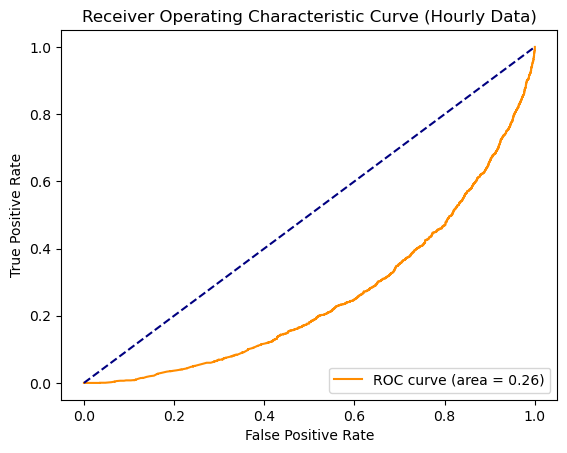

In [55]:
# Visualize Confusion Matrix & ROC_AUC Curve

from sklearn.metrics import confusion_matrix, roc_curve, auc
import seaborn as sns

# Confusion Matrix

conf_matrix = confusion_matrix(y_test, y_pred, labels=['depressed', 'nondepressed'])
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['depressed', 'nondepressed'], 
            yticklabels=['depressed', 'nondepressed'])
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title('Confusion Matrix RF on Hourly Data')
plt.show()

# ROC_AUC Curve
y_prob = best_rf.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_prob, pos_label='depressed')  # adjust pos_label if necessary
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic Curve (Hourly Data)')
plt.legend(loc="lower right")
plt.show()


## MODIFIED LOOCV WITH RF ON HOURLY DATA

In [13]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, matthews_corrcoef, cohen_kappa_score
from sklearn.model_selection import train_test_split
# Modified LOOCV with Randomized Search on Hourly Data:


# Classifier and parameter space for limited search
clf = RandomForestClassifier()

param_dist = {
    'n_estimators': [50, 100, 300],
    'max_features': ['sqrt', 'log2'],
    'max_depth': [None, 10, 30],
    'min_samples_split': [2, 10],
    'min_samples_leaf': [1, 4],
    'bootstrap': [True, False]
}

overall_results = []
feature_importances = []
all_true_labels = []
all_predicted_probs = []
all_predicted_labels = []

depressed_participants = hourly_stats[hourly_stats['status'] == 'depressed']['person'].unique().tolist()
non_depressed_participants = hourly_stats[hourly_stats['status'] == 'nondepressed']['person'].unique().tolist()


for depressed_participant in depressed_participants:
    non_depressed_participant = np.random.choice(non_depressed_participants)
    
    # Extract test set for a pair of depressed and non-depressed participants
    test_data = hourly_stats[(hourly_stats['person'] == depressed_participant) | 
                            (hourly_stats['person'] == non_depressed_participant)]
    
    # Everything else is used for training
    train_data = hourly_stats[(hourly_stats['person'] != depressed_participant) & 
                             (hourly_stats['person'] != non_depressed_participant)]
    
    X_train = train_data.drop(columns=['person', 'status', 'timestamp'])
    y_train = train_data['status']
    
    X_test = test_data.drop(columns=['person', 'status', 'timestamp'])
    y_test = test_data['status']
    
    # Limited Randomized Search
    random_search = RandomizedSearchCV(clf, param_distributions=param_dist, n_iter=10, cv=3, n_jobs=-1)
    random_search.fit(X_train, y_train)
    
    best_rf = random_search.best_estimator_
    predictions = best_rf.predict(X_test)
    all_predicted_labels.extend(predictions)

    
    # Metrics
    report = classification_report(y_test, predictions, output_dict=True)
    mcc = matthews_corrcoef(y_test, predictions)
    kappa = cohen_kappa_score(y_test, predictions)
    auc_score = roc_auc_score(y_test, best_rf.predict_proba(X_test)[:,1])
    
    overall_results.append({'report': report, 'mcc': mcc, 'kappa': kappa, 'auc': auc_score})
    feature_importances.append(best_rf.feature_importances_)
    
    all_true_labels.extend(y_test)
    all_predicted_probs.extend(best_rf.predict_proba(X_test)[:,1])



C:\Users\DELL G7\AppData\Roaming\Python\Python39\site-packages\joblib\externals\loky\process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


In [ ]:
# Feature Importances
mean_importances = np.mean(feature_importances, axis=0)

# Get the sorted indices
sorted_indices = np.argsort(mean_importances)[::-1]

plt.figure(figsize=(10, 6))
sns.barplot(x=mean_importances[sorted_indices], y=X_train.columns[sorted_indices])
plt.title('Feature Importances from LOOCV with RF on Hourly Data')
plt.show()


In [ ]:
from sklearn.metrics import classification_report

# Using the earlier created predicted labels
print(classification_report(all_true_labels, all_predicted_labels))


In [ ]:
# Average Metrics
avg_mcc = np.mean([result['mcc'] for result in overall_results])
avg_kappa = np.mean([result['kappa'] for result in overall_results])
print(f"Average MCC(LOOCV with RF on hourly Data): {avg_mcc}")
print(f"Average Kappa(LOOCV with RF on Hourly Data): {avg_kappa}")

In [ ]:
# Confusion Matrix
predicted_labels = ['depressed' if prob > 0.5 else 'nondepressed' for prob in all_predicted_probs]

# Confusion Matrix
avg_confusion = confusion_matrix(all_true_labels, predicted_labels)
sns.heatmap(avg_confusion, annot=True, cmap="Blues", fmt="g", xticklabels=['nondepressed', 'depressed'], yticklabels=['nondepressed', 'depressed'])
plt.title('Average Confusion Matrix for LOOCV with RFon Hourly Data')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


In [ ]:
# ROC AUC
fpr, tpr, _ = roc_curve(all_true_labels, all_predicted_probs, pos_label='depressed')
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of LOOCV with RF on Hourly Data')
plt.legend(loc="lower right")
plt.show()

##  LOGISTIC REGRESSION ON DAILY DATA

In [221]:
from sklearn.preprocessing import StandardScaler
# Find the Best Parameters using Randomized Search

from sklearn.linear_model import LogisticRegression


# Define the parameters to search
param_dist = {
    'C': np.logspace(-4, 4, 20),
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga'],
    'max_iter': [100, 1000, 5000]
}


# Initialize Logistic Regression
log_reg = LogisticRegression()

# Initialize RandomizedSearchCV
log_reg_random_search = RandomizedSearchCV(log_reg, param_distributions=param_dist,
                                           n_iter=50, cv=10, verbose=2, random_state=42, n_jobs=-1)

# Fit the model
X = daily_stats.drop(columns=['status', 'person', 'timestamp', 'date'])
y = daily_stats['status']


# Scale the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

log_reg_random_search.fit(X_scaled, y)

# Best parameters
best_params = log_reg_random_search.best_params_


Fitting 10 folds for each of 50 candidates, totalling 500 fits


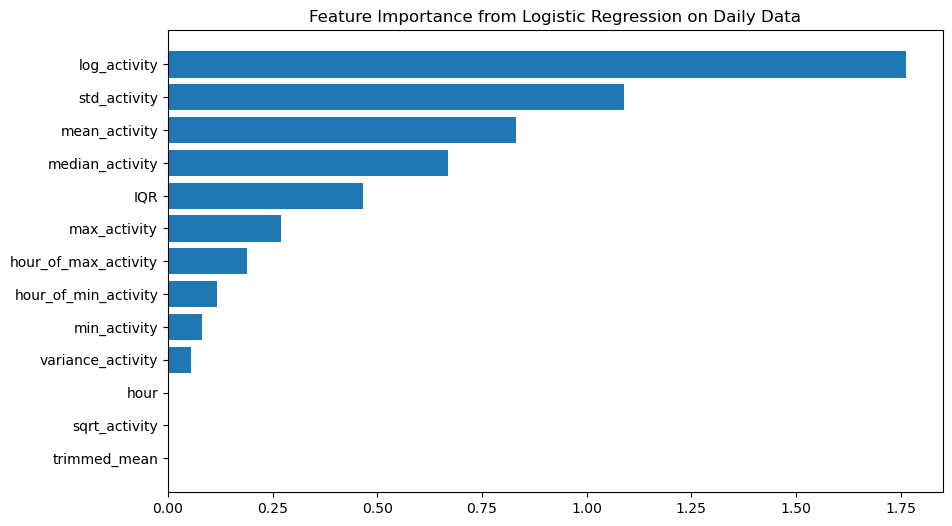

In [222]:
best_log_reg = log_reg_random_search.best_estimator_
coefficients = best_log_reg.coef_[0]
importance = np.abs(coefficients)

# Sort feature importances in descending order and get the indices
indices = np.argsort(importance)[::-1]

# Rearrange feature names so they match the sorted feature importances
names = [X.columns[i] for i in indices]

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.title("Feature Importance from Logistic Regression on Daily Data")
plt.barh(range(X.shape[1]), importance[indices], align='center')
plt.yticks(range(X.shape[1]), names)
plt.gca().invert_yaxis()
plt.show()


In [223]:
# Predictions
y_pred = best_log_reg.predict(X_scaled)
y_pred_proba = best_log_reg.predict_proba(X_scaled)[:, 1]

# Metrics
print(classification_report(y, y_pred))
print("MCC(LR on Daily Data): ", matthews_corrcoef(y, y_pred))
print("Cohen Kappa(LR on Daily Data): ", cohen_kappa_score(y, y_pred))



              precision    recall  f1-score   support

   depressed       0.67      0.57      0.62       405
nondepressed       0.78      0.84      0.81       739

    accuracy                           0.75      1144
   macro avg       0.72      0.71      0.71      1144
weighted avg       0.74      0.75      0.74      1144

MCC(LR on Daily Data):  0.4318187780483016
Cohen Kappa(LR on Daily Data):  0.428873487607189


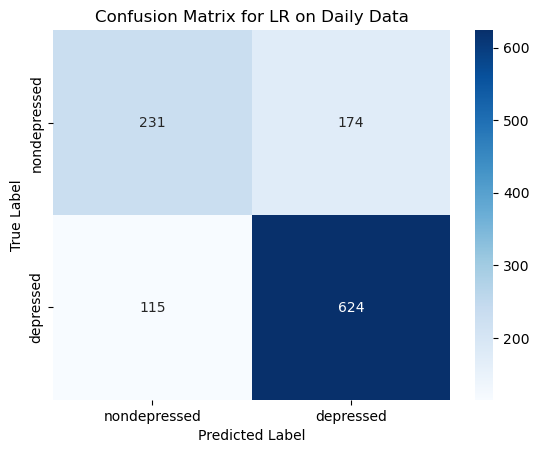

In [224]:
# Confusion Matrix
confusion = confusion_matrix(y, y_pred)
sns.heatmap(confusion, annot=True, cmap="Blues", fmt="g", xticklabels=['nondepressed', 'depressed'], yticklabels=['nondepressed', 'depressed'])
plt.title('Confusion Matrix for LR on Daily Data')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

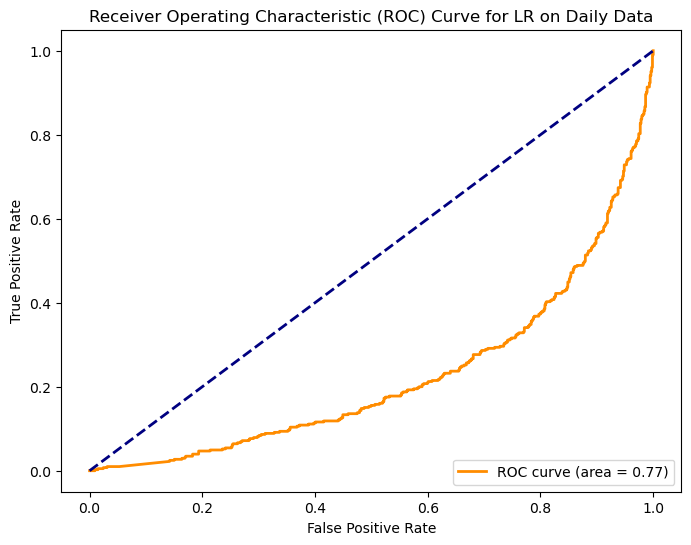

In [225]:
# ROC-AUC Curve
fpr, tpr, thresholds = roc_curve(y, y_pred_proba, pos_label='depressed')
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc_score(y, y_pred_proba):.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for LR on Daily Data')
plt.legend(loc='lower right')
plt.show()

## MODIFIED LOOCV WITH LR ON DAILY DATA

In [227]:
# Modified LOOCV with Randomized Search:




# Classifier and parameter space for limited search
clf = LogisticRegression()

param_dist = {
    'C': np.logspace(-4, 4, 20),
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga'],
    'max_iter': [1000, 10000, 100000]
}

overall_results = []
feature_importances = []
all_true_labels = []
all_predicted_probs = []
feature_coefficients = []
all_predicted_labels = []


depressed_participants = daily_stats[daily_stats['status'] == 'depressed']['person'].unique().tolist()
non_depressed_participants = daily_stats[daily_stats['status'] == 'nondepressed']['person'].unique().tolist()

scaler = StandardScaler()  # Initializing the scaler

for depressed_participant in depressed_participants:
    non_depressed_participant = np.random.choice(non_depressed_participants)
    
    # Extract test set for a pair of depressed and non-depressed participants
    test_data = daily_stats[(daily_stats['person'] == depressed_participant) | 
                            (daily_stats['person'] == non_depressed_participant)]
    
    # Everything else is used for training
    train_data = daily_stats[(daily_stats['person'] != depressed_participant) & 
                             (daily_stats['person'] != non_depressed_participant)]
    
    X_train = train_data.drop(columns=['person', 'status', 'timestamp','date'])
    y_train = train_data['status']
    
    X_test = test_data.drop(columns=['person', 'status', 'timestamp', 'date'])
    y_test = test_data['status']
    
    # Scale X_train and X_test
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    # Limited Randomized Search
    random_search = RandomizedSearchCV(clf, param_distributions=param_dist,
                                       n_iter=10, cv=10, n_jobs=-1)
    random_search.fit(X_train, y_train)
    
    best_lr = random_search.best_estimator_
    predictions = best_lr.predict(X_test)
    all_predicted_labels.extend(predictions)

    
    # Metrics
    report = classification_report(y_test, predictions, zero_division=1, output_dict=True)
    mcc = matthews_corrcoef(y_test, predictions)
    kappa = cohen_kappa_score(y_test, predictions)
    auc_score = roc_auc_score(y_test, best_lr.predict_proba(X_test)[:,1])
    
    overall_results.append({'report': report, 'mcc': mcc, 'kappa': kappa, 'auc': auc_score})
    all_true_labels.extend(y_test)
    all_predicted_probs.extend(best_lr.predict_proba(X_test)[:,1])
    
    best_lr = random_search.best_estimator_
    feature_coefficients.append(best_lr.coef_[0])




C:\Users\DELL G7\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\DELL G7\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\DELL G7\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\DELL G7\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\DELL G7\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


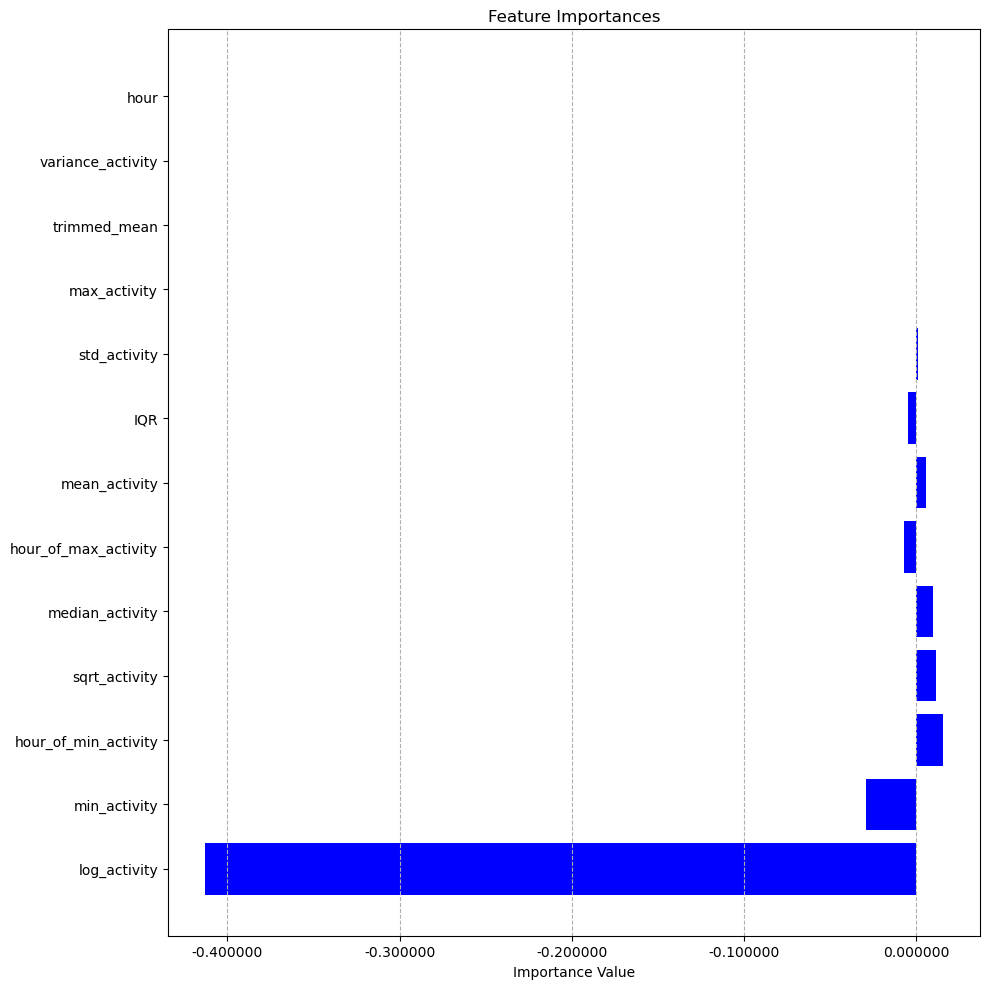

In [237]:
# Average out the coefficients over all iterations to get a sense of general importance


# Given features and importances
features = feature_importance_df['Feature'].tolist()
importances = feature_importance_df['Importance'].tolist()

# Sort by the absolute magnitude of importances for visualization
indices = np.argsort(np.abs(importances))[::-1]  # Inverted to show in descending order

# Plot
plt.figure(figsize=(10,10))
plt.title('Feature Importances of LOOCV with LR on DAily Data')
plt.barh(range(len(indices)), [importances[i] for i in indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Importance Value')
plt.gca().xaxis.set_major_formatter('{:.6f}'.format)
plt.grid(axis='x', linestyle='--')
plt.tight_layout()
plt.show()


In [238]:
import pandas as pd

# Create a dataframe for features and their corresponding importances
feature_importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': importances
})

# Sort the dataframe by the absolute magnitude of importances
feature_importance_df = feature_importance_df.reindex(feature_importance_df.Importance.abs().sort_values(ascending=False).index)

# Display the sorted dataframe
print(feature_importance_df)


                 Feature  Importance
0           log_activity   -0.413204
1           min_activity   -0.029083
2   hour_of_min_activity    0.015669
3          sqrt_activity    0.011637
4        median_activity    0.009985
5   hour_of_max_activity   -0.007022
6          mean_activity    0.005899
7                    IQR   -0.004498
8           std_activity    0.001272
9           max_activity   -0.000233
10          trimmed_mean    0.000042
11     variance_activity    0.000007
12                  hour    0.000000


In [239]:
# Using the earlier created predicted labels
all_true_labels_numeric = [1 if label == 'depressed' else 0 for label in all_true_labels]
all_predicted_labels_numeric = [1 if label == 'depressed' else 0 for label in all_predicted_labels]

print(classification_report(all_true_labels_numeric, all_predicted_labels_numeric))


              precision    recall  f1-score   support

           0       0.69      0.84      0.76       551
           1       0.69      0.48      0.57       405

    accuracy                           0.69       956
   macro avg       0.69      0.66      0.66       956
weighted avg       0.69      0.69      0.68       956



In [240]:
# Matthews Correlation Coefficient
mcc = matthews_corrcoef(all_true_labels_numeric, all_predicted_labels_numeric)
print(f"MCC of LOOCV with LR on Daily Data: {mcc:.4f}")

# Cohen's Kappa
kappa = cohen_kappa_score(all_true_labels_numeric, all_predicted_labels_numeric)
print(f"Cohen's Kappa of LOOCV with LR on Daily Data: {kappa:.4f}")


MCC of LOOCV with LR on Daily Data: 0.3506
Cohen's Kappa of LOOCV with LR on Daily Data: 0.3376


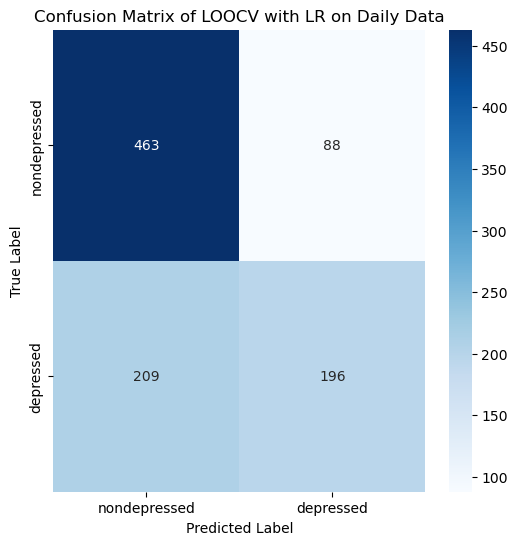

In [241]:
# 1. Confusion Matrix
cm = confusion_matrix(all_true_labels_numeric, all_predicted_labels_numeric)
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, cmap="Blues", fmt="g", xticklabels=['nondepressed', 'depressed'], yticklabels=['nondepressed', 'depressed'])
plt.title('Confusion Matrix of LOOCV with LR on Daily Data')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

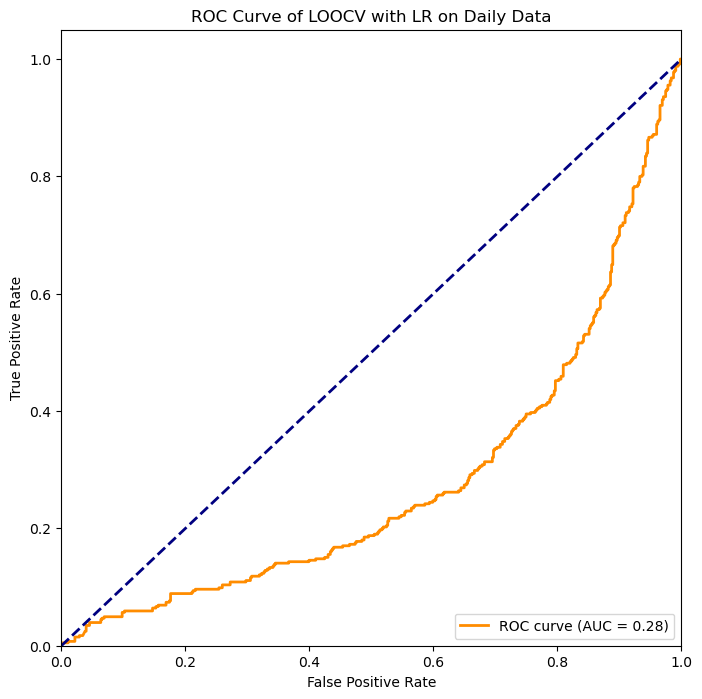

In [242]:
# 2. ROC AUC
fpr, tpr, thresholds = roc_curve(all_true_labels_numeric, all_predicted_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of LOOCV with LR on Daily Data')
plt.legend(loc="lower right")
plt.show()

## LOGISTIC REGRESSION ON HOURLY DATA

In [243]:



# Define the parameters to search
param_dist = {
    'C': np.logspace(-4, 4, 20),
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga'],
    'max_iter': [100, 1000, 5000]
}


# Initialize Logistic Regression
log_reg = LogisticRegression()

# Initialize RandomizedSearchCV
log_reg_random_search = RandomizedSearchCV(log_reg, param_distributions=param_dist,
                                           n_iter=50, cv=10, verbose=2, random_state=42, n_jobs=-1)

# Fit the model
X = hourly_stats.drop(columns=['status', 'person', 'timestamp'])
y = hourly_stats['status']


# Scale the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

log_reg_random_search.fit(X_scaled, y)

# Best parameters
best_params = log_reg_random_search.best_params_


Fitting 10 folds for each of 50 candidates, totalling 500 fits


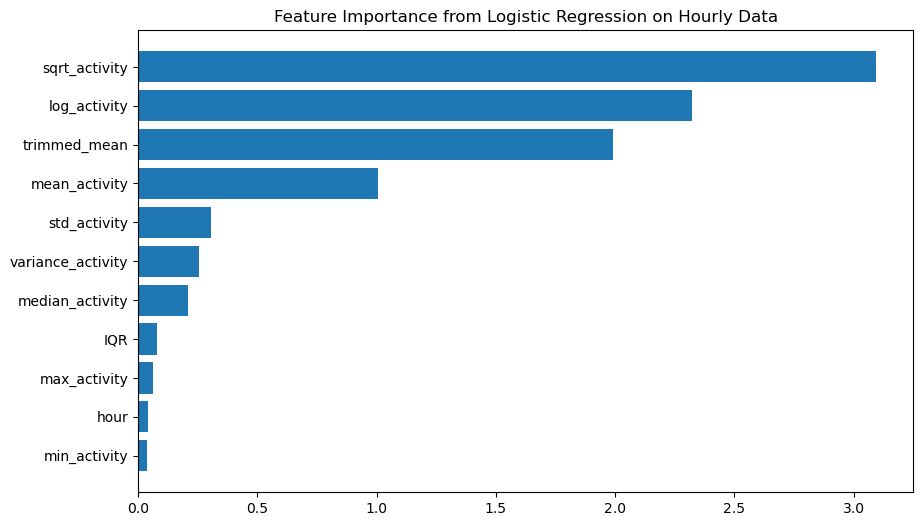

In [244]:
best_log_reg = log_reg_random_search.best_estimator_
coefficients = best_log_reg.coef_[0]
importance = np.abs(coefficients)

# Sort feature importances in descending order and get the indices
indices = np.argsort(importance)[::-1]

# Rearrange feature names so they match the sorted feature importances
names = [X.columns[i] for i in indices]

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.title("Feature Importance from Logistic Regression on Hourly Data")
plt.barh(range(X.shape[1]), importance[indices], align='center')
plt.yticks(range(X.shape[1]), names)
plt.gca().invert_yaxis()
plt.show()


In [245]:
# Predictions using the scaled data
y_pred = best_log_reg.predict(X_scaled)
y_pred_proba = best_log_reg.predict_proba(X_scaled)[:, 1]

# Metrics
print(classification_report(y, y_pred))
print("MCC(LR on Hourly Data): ", matthews_corrcoef(y, y_pred))
print("Cohen Kappa(LR on Hourly Data): ", cohen_kappa_score(y, y_pred))


              precision    recall  f1-score   support

   depressed       0.58      0.20      0.30      9214
nondepressed       0.68      0.92      0.78     17021

    accuracy                           0.67     26235
   macro avg       0.63      0.56      0.54     26235
weighted avg       0.65      0.67      0.61     26235

MCC(LR on Hourly Data):  0.17892184552945734
Cohen Kappa(LR on Hourly Data):  0.1441506132965752


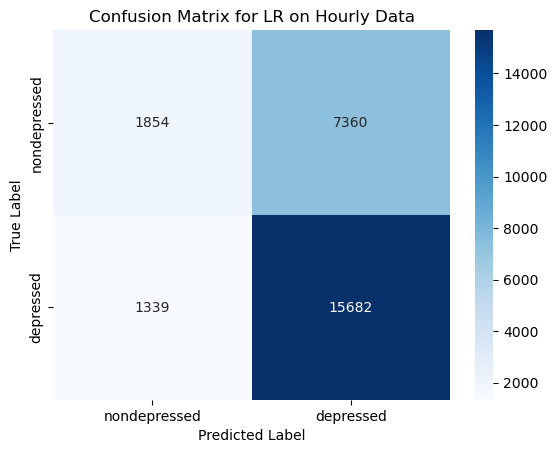

In [246]:
# Confusion Matrix
confusion = confusion_matrix(y, y_pred)
sns.heatmap(confusion, annot=True, cmap="Blues", fmt="g", xticklabels=['nondepressed', 'depressed'], yticklabels=['nondepressed', 'depressed'])
plt.title('Confusion Matrix for LR on Hourly Data')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

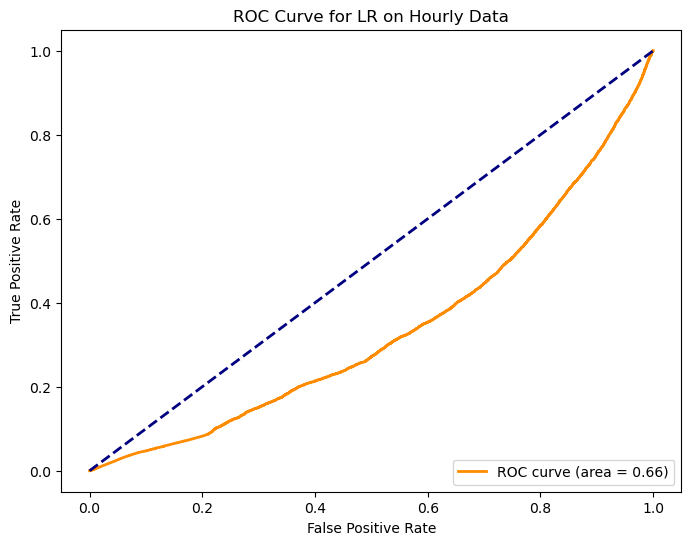

In [247]:
# ROC-AUC Curve
fpr, tpr, thresholds = roc_curve(y, y_pred_proba, pos_label='depressed')
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc_score(y, y_pred_proba):.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for LR on Hourly Data')
plt.legend(loc='lower right')
plt.show()


## MODIFIED LOOCV WITH LR ON HOURLY DATA

In [248]:
# Modified LOOCV with Randomized Search:


# Classifier and parameter space for limited search
clf = LogisticRegression()

param_dist = {
    'C': np.logspace(-4, 4, 20),
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga'],
    'max_iter': [100, 1000, 5000]
}


overall_results = []
feature_importances = []
all_true_labels = []
all_predicted_probs = []
feature_coefficients = []
all_predicted_labels = []


depressed_participants = hourly_stats[hourly_stats['status'] == 'depressed']['person'].unique().tolist()
non_depressed_participants = hourly_stats[hourly_stats['status'] == 'nondepressed']['person'].unique().tolist()


scaler = StandardScaler()  # Initializing the scaler

for depressed_participant in depressed_participants:
    non_depressed_participant = np.random.choice(non_depressed_participants)
    
    # Extract test set for a pair of depressed and non-depressed participants
    test_data = hourly_stats[(hourly_stats['person'] == depressed_participant) | 
                            (hourly_stats['person'] == non_depressed_participant)]
    
    # Everything else is used for training
    train_data = hourly_stats[(hourly_stats['person'] != depressed_participant) & 
                             (hourly_stats['person'] != non_depressed_participant)]
    
    X_train = train_data.drop(columns=['person', 'status', 'timestamp'])
    y_train = train_data['status']
    
    X_test = test_data.drop(columns=['person', 'status', 'timestamp'])
    y_test = test_data['status']
    
            # Scale X_train and X_test
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    # Limited Randomized Search
    random_search = RandomizedSearchCV(clf, param_distributions=param_dist,
                                       n_iter=10, cv=10, n_jobs=-1)
    random_search.fit(X_train, y_train)
    
    best_lr = random_search.best_estimator_
    predictions = best_lr.predict(X_test)
    all_predicted_labels.extend(predictions)
    
    # Metrics
    report = classification_report(y_test, predictions, zero_division=1, output_dict=True)
    mcc = matthews_corrcoef(y_test, predictions)
    kappa = cohen_kappa_score(y_test, predictions)
    auc_score = roc_auc_score(y_test, best_lr.predict_proba(X_test)[:,1])
    
    overall_results.append({'report': report, 'mcc': mcc, 'kappa': kappa, 'auc': auc_score})
    all_true_labels.extend(y_test)
    all_predicted_probs.extend(best_lr.predict_proba(X_test)[:,1])
    
    best_lr = random_search.best_estimator_
    feature_coefficients.append(best_lr.coef_[0])



C:\Users\DELL G7\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\DELL G7\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\DELL G7\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\DELL G7\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\DELL G7\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\D

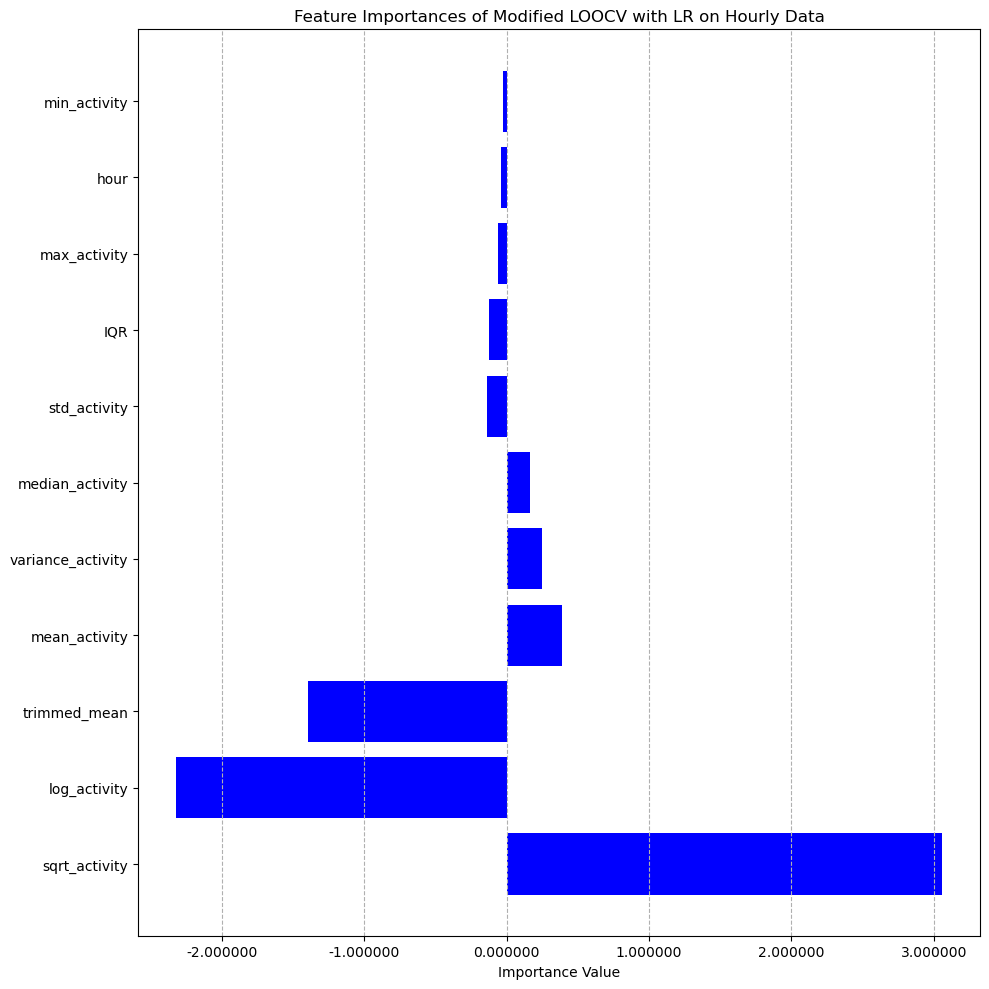

              Feature  Importance
9       sqrt_activity    3.055364
8        log_activity   -2.319880
7        trimmed_mean   -1.396009
0       mean_activity    0.386782
3   variance_activity    0.246297
1     median_activity    0.165707
2        std_activity   -0.138918
6                 IQR   -0.122565
5        max_activity   -0.060772
10               hour   -0.039656
4        min_activity   -0.027125


In [254]:
# Average out the coefficients over all iterations to get a sense of general importance

# Create a dataframe for features and their corresponding importances
average_coefficients = np.mean(feature_coefficients, axis=0)

feature_importance_df = pd.DataFrame({
    'Feature': X.columns,  # Assuming X still holds the column names
    'Importance': average_coefficients
})

# Sort the dataframe by the absolute magnitude of importances
feature_importance_df = feature_importance_df.reindex(feature_importance_df.Importance.abs().sort_values(ascending=False).index)

# Plotting
features = feature_importance_df['Feature'].tolist()
importances = feature_importance_df['Importance'].tolist()
indices = np.argsort(np.abs(importances))[::-1]

plt.figure(figsize=(10,10))
plt.title('Feature Importances of Modified LOOCV with LR on Hourly Data')
plt.barh(range(len(indices)), [importances[i] for i in indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Importance Value')
plt.gca().xaxis.set_major_formatter('{:.6f}'.format)
plt.grid(axis='x', linestyle='--')
plt.tight_layout()
plt.show()

# Display the sorted dataframe
print(feature_importance_df)




In [255]:
# Convert all_predicted_labels to numeric format
all_predicted_labels_numeric = [1 if label == 'depressed' else 0 for label in all_predicted_labels]
all_true_labels_numeric = [1 if label == 'depressed' else 0 for label in all_true_labels]

# Using the earlier created predicted labels
print(classification_report(all_true_labels_numeric, all_predicted_labels_numeric, zero_division=1))

              precision    recall  f1-score   support

           0       0.55      0.91      0.69     10404
           1       0.64      0.17      0.27      9214

    accuracy                           0.57     19618
   macro avg       0.60      0.54      0.48     19618
weighted avg       0.59      0.57      0.49     19618



In [256]:
# Matthews Correlation Coefficient
mcc = matthews_corrcoef(all_true_labels_numeric, all_predicted_labels_numeric)
print(f"MCC of LOOCV with LR on Hourly Data: {mcc:.4f}")

# Cohen's Kappa
kappa = cohen_kappa_score(all_true_labels_numeric, all_predicted_labels_numeric)
print(f"Cohen's Kappa of LOOCV with LR on Hourly Data: {kappa:.4f}")


MCC of LOOCV with LR on Hourly Data: 0.1289
Cohen's Kappa of LOOCV with LR on Hourly Data: 0.0895


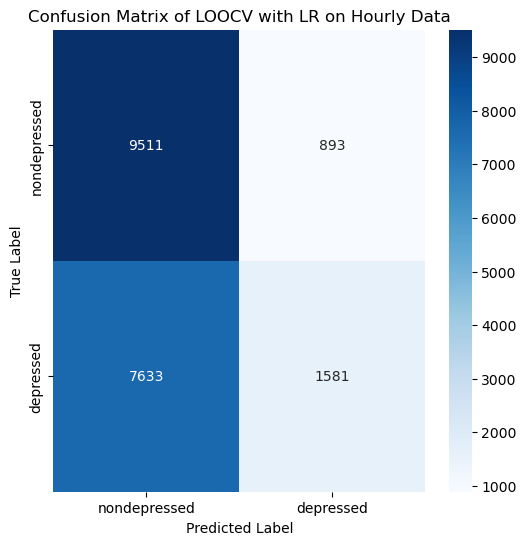

In [257]:
# 1. Confusion Matrix
cm = confusion_matrix(all_true_labels_numeric, all_predicted_labels_numeric)
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, cmap="Blues", fmt="g", xticklabels=['nondepressed', 'depressed'], yticklabels=['nondepressed', 'depressed'])
plt.title('Confusion Matrix of LOOCV with LR on Hourly Data')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

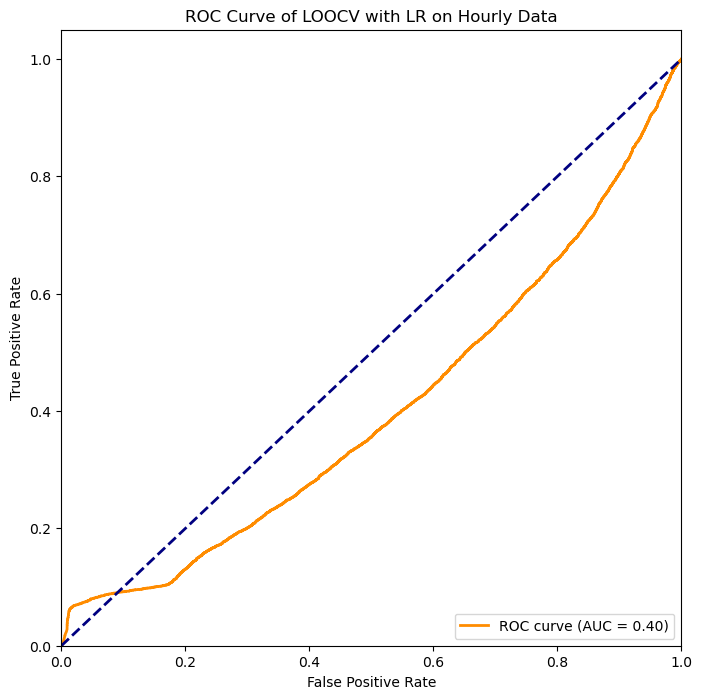

In [258]:
# 2. ROC AUC
fpr, tpr, thresholds = roc_curve(all_true_labels_numeric, all_predicted_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of LOOCV with LR on Hourly Data')
plt.legend(loc="lower right")
plt.show()

## XGBOOST ON DAILY DATA

In [259]:
pip install xgboost


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [261]:
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder

# Define parameter grid for XGBoost
param_dist = {
    'learning_rate': np.linspace(0.01, 1, 10),
    'max_depth': [3, 4, 5, 6, 7, 8, 9, 10],
    'n_estimators': [50, 100, 150, 200, 250, 300],
    'gamma': np.linspace(0.01, 1, 10),
    'subsample': np.linspace(0.1, 1, 10),
    'colsample_bytree': np.linspace(0.1, 1, 10)
}

clf = XGBClassifier(objective='binary:logistic', eval_metric='logloss')

X = daily_stats.drop(columns=['status', 'person', 'timestamp', 'date'])
y = daily_stats['status']

# Scale the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize and transform the labels using LabelEncoder
le = LabelEncoder()
y_encoded = le.fit_transform(y)

random_search = RandomizedSearchCV(clf, param_distributions=param_dist, n_iter=50, cv=10, n_jobs=-1, verbose=1)
random_search.fit(X_scaled, y_encoded)

best_xgb = random_search.best_estimator_

print("Best Parameters:", random_search.best_params_)


Fitting 10 folds for each of 50 candidates, totalling 500 fits
Best Parameters: {'subsample': 0.6, 'n_estimators': 150, 'max_depth': 7, 'learning_rate': 0.01, 'gamma': 0.89, 'colsample_bytree': 0.1}


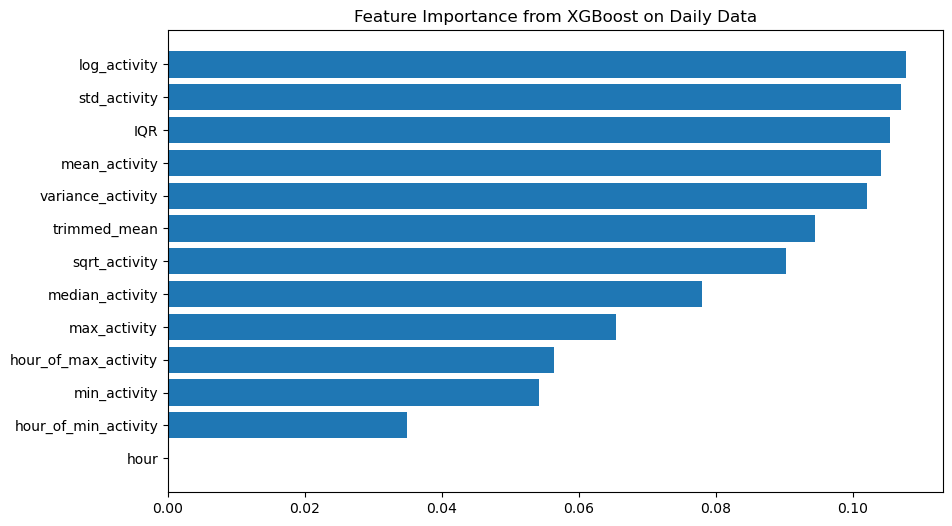

In [262]:


# Extract feature importances from the best XGBoost model
importances = best_xgb.feature_importances_

# Sort feature importances in descending order and get the indices
indices = np.argsort(importances)[::-1]

# Get the feature names
features = X.columns

# Visualize the feature importances
plt.figure(figsize=(10, 6))
plt.title("Feature Importance from XGBoost on Daily Data")
plt.barh(range(X.shape[1]), importances[indices], align='center')
plt.yticks(range(X.shape[1]), [features[i] for i in indices])
plt.gca().invert_yaxis()
plt.show()


In [263]:
# Predictions
y_pred = best_xgb.predict(X_scaled)
y_pred_proba = best_xgb.predict_proba(X_scaled)[:, 1]

# Metrics
print(classification_report(y_encoded, y_pred))

# Matthews Correlation Coefficient
mcc = matthews_corrcoef(y_encoded, y_pred)
print(f"MCC of XGBoost on Daily Data: {mcc:.4f}")

# Cohen's Kappa
kappa = cohen_kappa_score(y_encoded, y_pred)
print(f"Cohen's Kappa of XGBoost on Daily Data: {kappa:.4f}")


              precision    recall  f1-score   support

           0       0.86      0.49      0.62       405
           1       0.77      0.96      0.85       739

    accuracy                           0.79      1144
   macro avg       0.81      0.72      0.74      1144
weighted avg       0.80      0.79      0.77      1144

MCC of XGBoost on Daily Data: 0.5271
Cohen's Kappa of XGBoost on Daily Data: 0.4896


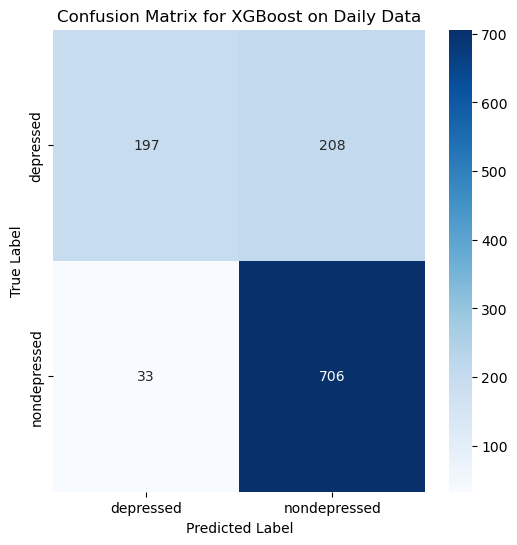

In [264]:
# Confusion Matrix
confusion = confusion_matrix(y_encoded, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(confusion, annot=True, cmap="Blues", fmt="g", xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for XGBoost on Daily Data')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

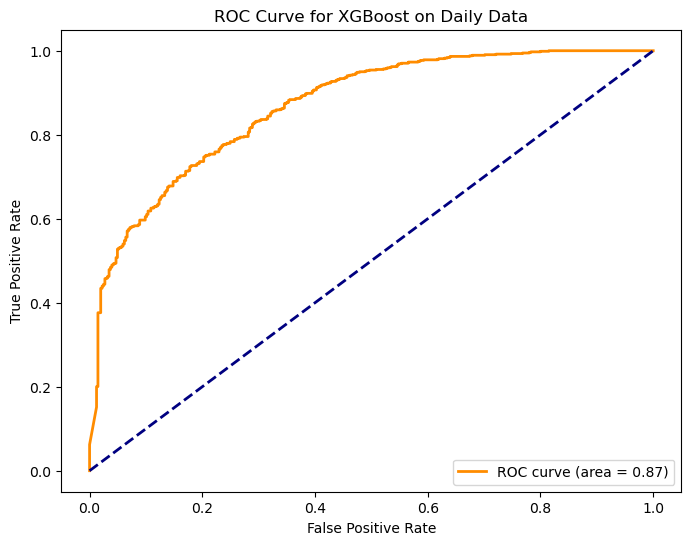

In [265]:
# ROC-AUC Curve
fpr, tpr, thresholds = roc_curve(y_encoded, y_pred_proba, pos_label=1)  # Since 'depressed' is encoded as 1
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc_score(y_encoded, y_pred_proba):.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for XGBoost on Daily Data')
plt.legend(loc='lower right')
plt.show()

## XGBOOST WITH MODIFIED LOOCV ON DAILY DATA

In [266]:
from sklearn.metrics import classification_report, matthews_corrcoef, cohen_kappa_score, roc_auc_score

overall_results = []
feature_importances = []
all_true_labels = []
all_predicted_probs = []

depressed_participants = daily_stats[daily_stats['status'] == 'depressed']['person'].unique().tolist()
non_depressed_participants = daily_stats[daily_stats['status'] == 'nondepressed']['person'].unique().tolist()

for depressed_participant in depressed_participants:
    non_depressed_participant = np.random.choice(non_depressed_participants)
    
    # Extract test set
    test_data = daily_stats[(daily_stats['person'] == depressed_participant) | (daily_stats['person'] == non_depressed_participant)]
    
    # Training set
    train_data = daily_stats[(daily_stats['person'] != depressed_participant) & (daily_stats['person'] != non_depressed_participant)]
    
    X_train = train_data.drop(columns=['person', 'status', 'timestamp', 'date'])
    y_train = le.transform(train_data['status'])
    X_test = test_data.drop(columns=['person', 'status', 'timestamp', 'date'])
    y_test = le.transform(test_data['status'])
    
    # Scale
    X_train = scaler.transform(X_train)
    X_test = scaler.transform(X_test)
    
    # Fit the best XGBoost model
    best_xgb.fit(X_train, y_train)
    predictions = best_xgb.predict(X_test)
    
    # Metrics
    report = classification_report(y_test, predictions, zero_division=1, output_dict=True)
    mcc = matthews_corrcoef(y_test, predictions)
    kappa = cohen_kappa_score(y_test, predictions)
    auc_score = roc_auc_score(y_test, best_xgb.predict_proba(X_test)[:,1])
    
    overall_results.append({'report': report, 'mcc': mcc, 'kappa': kappa, 'auc': auc_score})
    all_true_labels.extend(y_test)
    all_predicted_probs.extend(best_xgb.predict_proba(X_test)[:,1])
    feature_importances.append(best_xgb.feature_importances_)



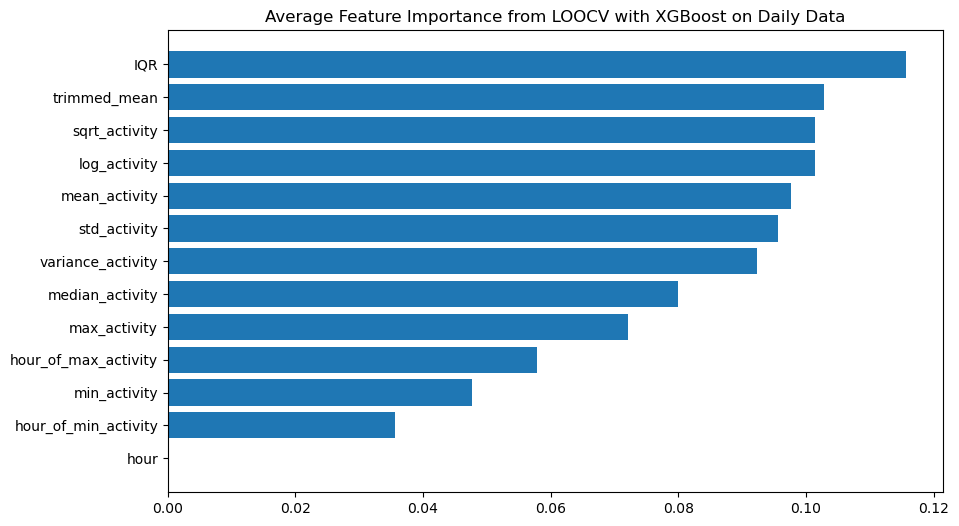

In [268]:
# Average out the feature importances over all iterations to get a sense of general importance
average_importance = np.mean(feature_importances, axis=0)

# Sort feature importances in descending order and get the indices
indices = np.argsort(average_importance)[::-1]

# Get the feature names
features = X.columns

# Visualize the feature importances
plt.figure(figsize=(10, 6))
plt.title("Average Feature Importance from LOOCV with XGBoost on Daily Data")
plt.barh(range(X.shape[1]), average_importance[indices], align='center')
plt.yticks(range(X.shape[1]), [features[i] for i in indices])
plt.gca().invert_yaxis()
plt.show()

In [273]:
# Aggregating Predictions for Overall Metrics
all_predicted_labels = [1 if prob >= 0.5 else 0 for prob in all_predicted_probs]

# 1. Classification Report
print(classification_report(all_true_labels, all_predicted_labels))

# 2. MCC
mcc = matthews_corrcoef(all_true_labels, all_predicted_labels)
print(f"MCC: {mcc:.4f}")

# 3. Cohen's Kappa
kappa = cohen_kappa_score(all_true_labels, all_predicted_labels)
print(f"Cohen's Kappa: {kappa:.4f}")

              precision    recall  f1-score   support

           0       0.81      0.38      0.52       405
           1       0.66      0.93      0.77       513

    accuracy                           0.69       918
   macro avg       0.73      0.66      0.64       918
weighted avg       0.72      0.69      0.66       918

MCC: 0.3792
Cohen's Kappa: 0.3288


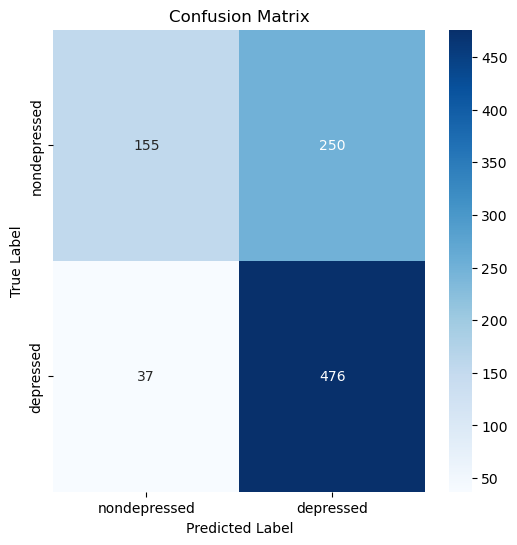

In [274]:
# Confusion Matrix

plt.figure(figsize=(6, 6))
cm = confusion_matrix(all_true_labels, all_predicted_labels)
sns.heatmap(cm, annot=True, cmap="Blues", fmt="g", xticklabels=['nondepressed', 'depressed'], yticklabels=['nondepressed', 'depressed'])
plt.title('Confusion Matrix of XGBOOST with LOOCV on Daily Data')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()



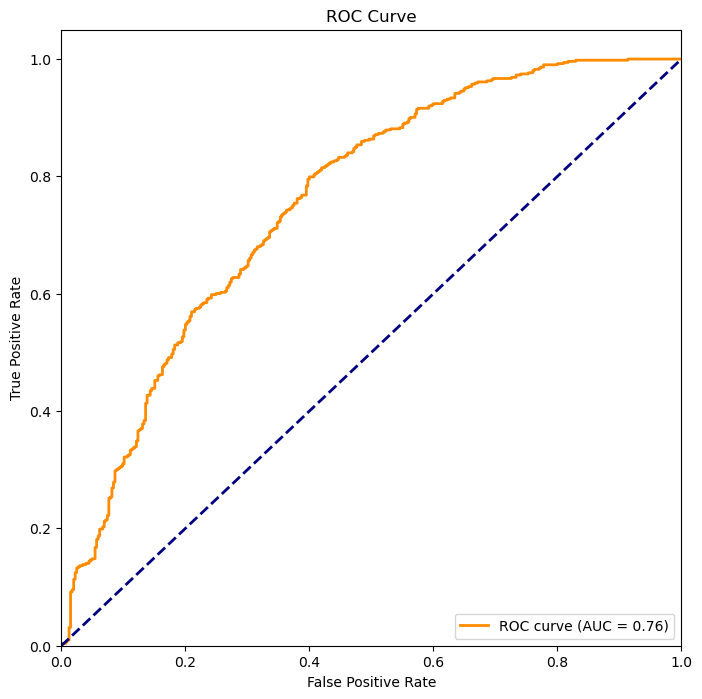

In [275]:
# ROC-AUC Curve
fpr, tpr, thresholds = roc_curve(all_true_labels, all_predicted_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

## XGBOOST ON HOURLY DATA

In [283]:
# Define parameter grid for XGBoost
param_dist = {
    'learning_rate': np.linspace(0.01, 1, 10),
    'max_depth': [3, 4, 5, 6, 7, 8, 9, 10],
    'n_estimators': [50, 100, 150, 200, 250, 300],
    'gamma': np.linspace(0.01, 1, 10),
    'subsample': np.linspace(0.1, 1, 10),
    'colsample_bytree': np.linspace(0.1, 1, 10)
}

clf = XGBClassifier(objective='binary:logistic', eval_metric='logloss')

X = hourly_stats.drop(columns=['status', 'person', 'timestamp'])
y = hourly_stats['status']

# Scale the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize and transform the labels using LabelEncoder
le = LabelEncoder()
y_encoded = le.fit_transform(y)

random_search = RandomizedSearchCV(clf, param_distributions=param_dist, n_iter=50, cv=10, n_jobs=-1, verbose=1)
random_search.fit(X_scaled, y_encoded)

best_xgb = random_search.best_estimator_

print("Best Parameters:", random_search.best_params_)

Fitting 10 folds for each of 50 candidates, totalling 500 fits
Best Parameters: {'subsample': 0.4, 'n_estimators': 100, 'max_depth': 6, 'learning_rate': 0.01, 'gamma': 0.89, 'colsample_bytree': 0.8}


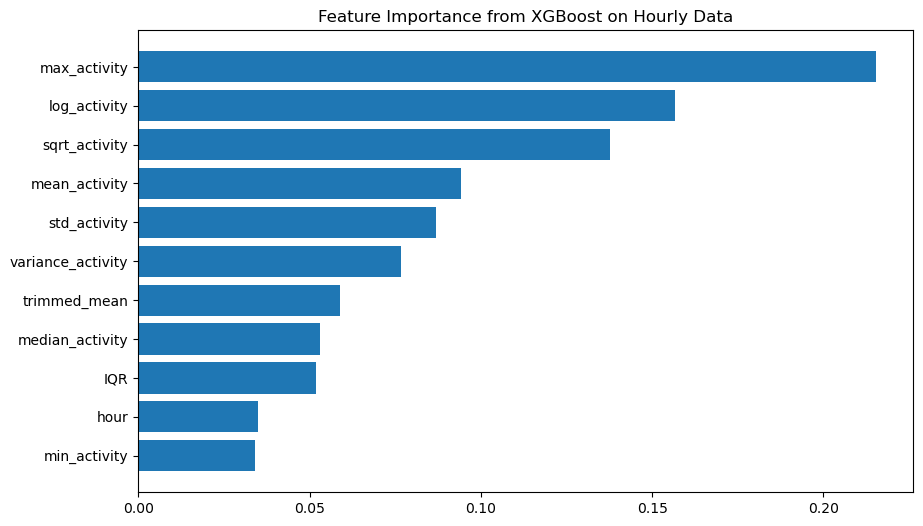

In [284]:


# Extract feature importances from the best XGBoost model
importances = best_xgb.feature_importances_

# Sort feature importances in descending order and get the indices
indices = np.argsort(importances)[::-1]

# Get the feature names
features = X.columns

# Visualize the feature importances
plt.figure(figsize=(10, 6))
plt.title("Feature Importance from XGBoost on Hourly Data")
plt.barh(range(X.shape[1]), importances[indices], align='center')
plt.yticks(range(X.shape[1]), [features[i] for i in indices])
plt.gca().invert_yaxis()
plt.show()


In [285]:
# Predictions
y_pred = best_xgb.predict(X_scaled)
y_pred_proba = best_xgb.predict_proba(X_scaled)[:, 1]

# Metrics
print(classification_report(y_encoded, y_pred))

# Matthews Correlation Coefficient
mcc = matthews_corrcoef(y_encoded, y_pred)
print(f"MCC of XGBoost on Hourly Data: {mcc:.4f}")

# Cohen's Kappa
kappa = cohen_kappa_score(y_encoded, y_pred)
print(f"Cohen's Kappa of XGBoost on Hourly Data: {kappa:.4f}")


              precision    recall  f1-score   support

           0       0.64      0.39      0.49      9214
           1       0.73      0.88      0.80     17021

    accuracy                           0.71     26235
   macro avg       0.68      0.64      0.64     26235
weighted avg       0.70      0.71      0.69     26235

MCC of XGBoost on Hourly Data: 0.3157
Cohen's Kappa of XGBoost on Hourly Data: 0.2988


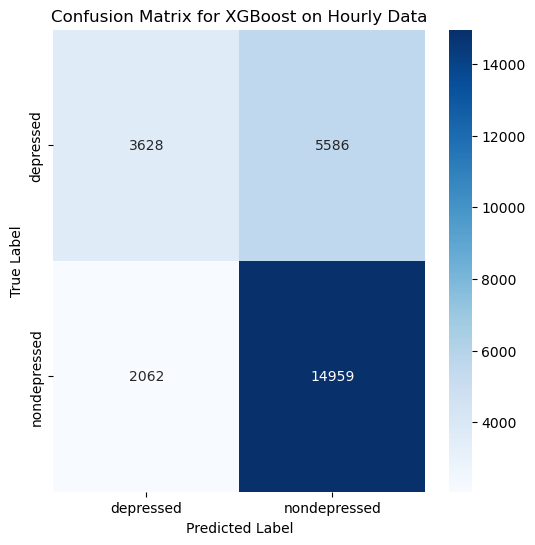

In [286]:


# Confusion Matrix
confusion = confusion_matrix(y_encoded, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(confusion, annot=True, cmap="Blues", fmt="g", xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for XGBoost on Hourly Data')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


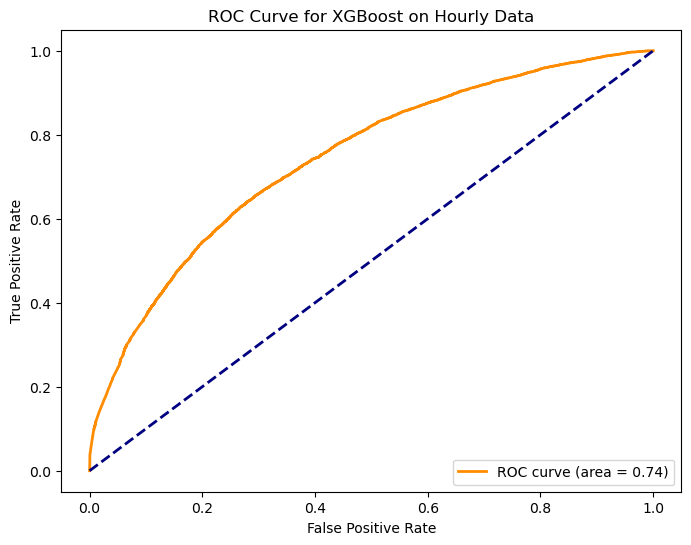

In [287]:
# ROC-AUC Curve
fpr, tpr, thresholds = roc_curve(y_encoded, y_pred_proba, pos_label=1)  # Since 'depressed' is encoded as 1
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc_score(y_encoded, y_pred_proba):.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for XGBoost on Hourly Data')
plt.legend(loc='lower right')
plt.show()

## XGBOOST WITH MODIFIED LOOCV ON HOURLY DATA

In [288]:
from sklearn.metrics import classification_report, matthews_corrcoef, cohen_kappa_score, roc_auc_score

overall_results = []
feature_importances = []
all_true_labels = []
all_predicted_probs = []

depressed_participants = hourly_stats[hourly_stats['status'] == 'depressed']['person'].unique().tolist()
non_depressed_participants = hourly_stats[hourly_stats['status'] == 'nondepressed']['person'].unique().tolist()

for depressed_participant in depressed_participants:
    non_depressed_participant = np.random.choice(non_depressed_participants)
    
    # Extract test set
    test_data = hourly_stats[(hourly_stats['person'] == depressed_participant) | (hourly_stats['person'] == non_depressed_participant)]
    
    # Training set
    train_data = hourly_stats[(hourly_stats['person'] != depressed_participant) & (hourly_stats['person'] != non_depressed_participant)]
    
    X_train = train_data.drop(columns=['person', 'status', 'timestamp'])
    y_train = le.transform(train_data['status'])
    X_test = test_data.drop(columns=['person', 'status', 'timestamp'])
    y_test = le.transform(test_data['status'])
    
    # Scale
    X_train = scaler.transform(X_train)
    X_test = scaler.transform(X_test)
    
    # Fit the best XGBoost model
    best_xgb.fit(X_train, y_train)
    predictions = best_xgb.predict(X_test)
    
    # Metrics
    report = classification_report(y_test, predictions, zero_division=1, output_dict=True)
    mcc = matthews_corrcoef(y_test, predictions)
    kappa = cohen_kappa_score(y_test, predictions)
    auc_score = roc_auc_score(y_test, best_xgb.predict_proba(X_test)[:,1])
    
    overall_results.append({'report': report, 'mcc': mcc, 'kappa': kappa, 'auc': auc_score})
    all_true_labels.extend(y_test)
    all_predicted_probs.extend(best_xgb.predict_proba(X_test)[:,1])
    feature_importances.append(best_xgb.feature_importances_)



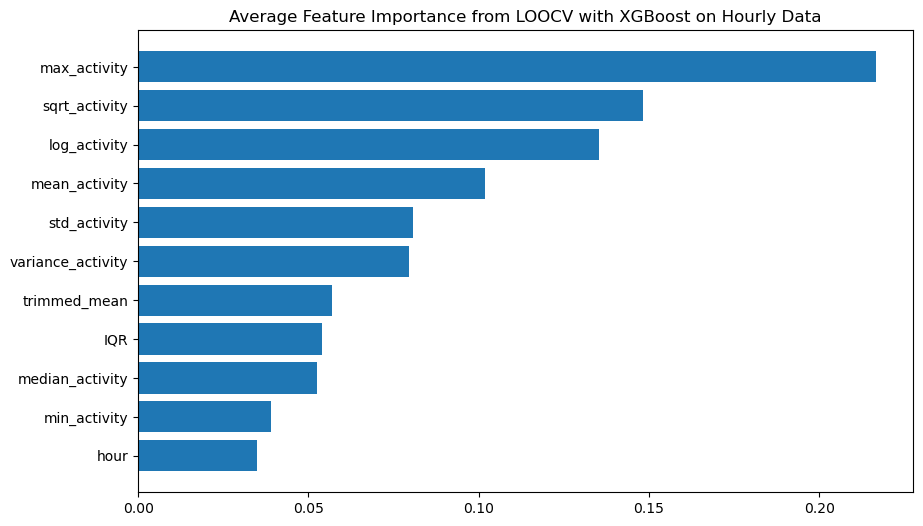

In [289]:
# Average out the feature importances over all iterations to get a sense of general importance
average_importance = np.mean(feature_importances, axis=0)

# Sort feature importances in descending order and get the indices
indices = np.argsort(average_importance)[::-1]

# Get the feature names
features = X.columns

# Visualize the feature importances
plt.figure(figsize=(10, 6))
plt.title("Average Feature Importance from LOOCV with XGBoost on Hourly Data")
plt.barh(range(X.shape[1]), average_importance[indices], align='center')
plt.yticks(range(X.shape[1]), [features[i] for i in indices])
plt.gca().invert_yaxis()
plt.show()

In [290]:
# Aggregating Predictions for Overall Metrics
all_predicted_labels = [1 if prob >= 0.5 else 0 for prob in all_predicted_probs]

# 1. Classification Report
print(classification_report(all_true_labels, all_predicted_labels))

# 2. MCC
mcc = matthews_corrcoef(all_true_labels, all_predicted_labels)
print(f"MCC(LOOCV with XGBoost on Hourly Data): {mcc:.4f}")

# 3. Cohen's Kappa
kappa = cohen_kappa_score(all_true_labels, all_predicted_labels)
print(f"Cohen's Kappa(LOOCV with XGBoost on Hourly Data): {kappa:.4f}")

              precision    recall  f1-score   support

           0       0.58      0.32      0.41      9214
           1       0.61      0.82      0.70     12002

    accuracy                           0.60     21216
   macro avg       0.60      0.57      0.56     21216
weighted avg       0.60      0.60      0.58     21216

MCC(LOOCV with XGBoost on Hourly Data): 0.1658
Cohen's Kappa(LOOCV with XGBoost on Hourly Data): 0.1504


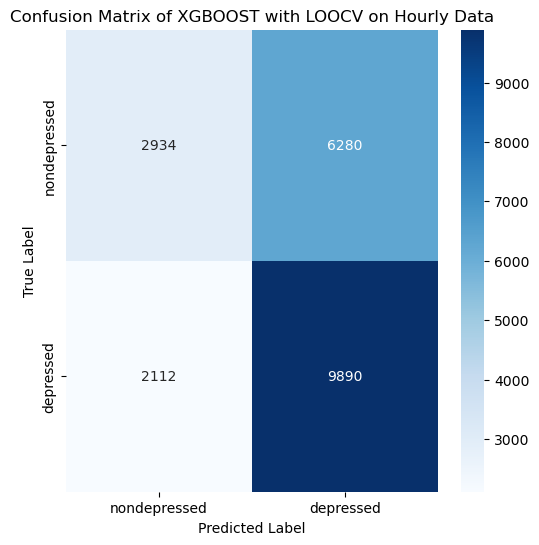

In [291]:
# Confusion Matrix

plt.figure(figsize=(6, 6))
cm = confusion_matrix(all_true_labels, all_predicted_labels)
sns.heatmap(cm, annot=True, cmap="Blues", fmt="g", xticklabels=['nondepressed', 'depressed'], yticklabels=['nondepressed', 'depressed'])
plt.title('Confusion Matrix of XGBOOST with LOOCV on Hourly Data')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()



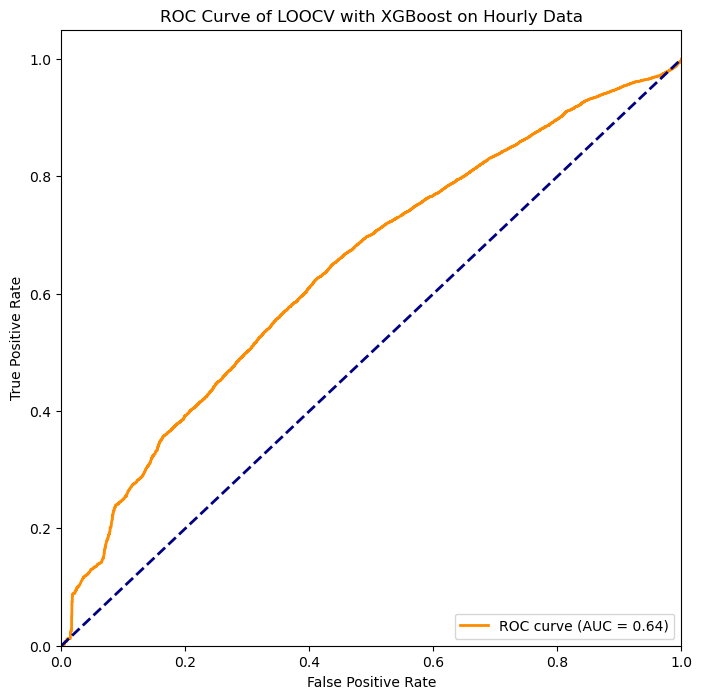

In [292]:
# ROC-AUC Curve
fpr, tpr, thresholds = roc_curve(all_true_labels, all_predicted_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of LOOCV with XGBoost on Hourly Data')
plt.legend(loc="lower right")
plt.show()

## SVM ON DAILY DATA

In [17]:
daily_stats.head()

,person,status,timestamp,mean_activity,median_activity,std_activity,variance_activity,min_activity,max_activity,IQR,trimmed_mean,log_activity,sqrt_activity,hour_of_max_activity,hour_of_min_activity
0,condition_1,depressed,2003-05-07,174.144444,76.0,240.053885,57625.867841,0,2284,248.00,126.621528,5.165611,13.196380,23,12
1,condition_1,depressed,2003-05-08,156.247222,27.0,229.109777,52491.289777,0,1954,252.25,108.887153,5.057819,12.499889,10,0
2,condition_1,depressed,2003-05-09,124.135417,14.0,211.241278,44622.877411,0,1672,172.00,74.414062,4.829396,11.141607,12,0
3,condition_1,depressed,2003-05-10,134.961806,33.0,230.954732,53340.088186,0,2146,184.00,81.945312,4.912374,11.617306,18,0
4,condition_1,depressed,2003-05-11,99.439583,15.0,177.719972,31584.388286,0,2080,134.00,57.969618,4.609556,9.971940,23,0


In [16]:
from sklearn.svm import SVC
from scipy.stats import reciprocal, uniform

param_dist = {
    'C': uniform(0.1, 10),
    'gamma': reciprocal(0.001, 1),
    'kernel': ['linear', 'rbf']
}

svm = SVC(probability=True)  # setting probability=True allows us to use predict_proba for ROC later

random_search = RandomizedSearchCV(svm, param_distributions=param_dist, n_iter=50, cv=10, verbose=1, n_jobs=-1)
X = daily_stats.drop(columns=['status', 'person', 'timestamp', 'date'])
y = le.transform(daily_stats['status'])  # Using the earlier initialized LabelEncoder

X_scaled = scaler.fit_transform(X)  # Using the earlier initialized scaler

random_search.fit(X_scaled, y)

best_svm = random_search.best_estimator_


KeyError: "['date'] not found in axis"

In [298]:
print(best_svm)

SVC(C=8.401158560358398, gamma=0.02045229394149523, probability=True)


In [294]:
if best_svm.kernel == 'linear':
    # Only for linear kernel
    importance = best_svm.coef_[0]
    indices = np.argsort(np.abs(importance))[::-1]
    features = X.columns

    plt.figure(figsize=(10,6))
    plt.title('Feature Importances from SVM')
    plt.barh(range(X.shape[1]), importance[indices], align='center')
    plt.yticks(range(X.shape[1]), [features[i] for i in indices])
    plt.gca().invert_yaxis()
    plt.show()


In [295]:
# Predictions
y_pred = best_svm.predict(X_scaled)
y_pred_proba = best_svm.predict_proba(X_scaled)[:, 1]

# Metrics
print(classification_report(y, y_pred))
print("MCC (SVM on Daily Data):", matthews_corrcoef(y, y_pred))
print("Cohen's Kappa(SVM on Daily Data):", cohen_kappa_score(y, y_pred))


              precision    recall  f1-score   support

           0       0.67      0.63      0.65       405
           1       0.80      0.83      0.82       739

    accuracy                           0.76      1144
   macro avg       0.74      0.73      0.73      1144
weighted avg       0.76      0.76      0.76      1144

MCC (SVM on Daily Data): 0.46754566772095674
Cohen's Kappa(SVM on Daily Data): 0.4669964760097587


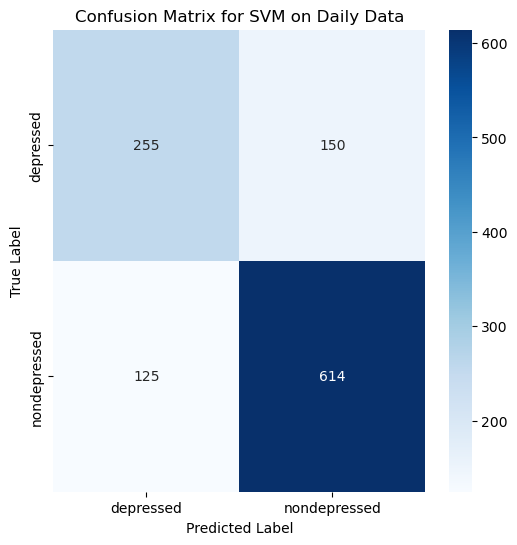

In [296]:
# Confusion Matrix
confusion = confusion_matrix(y, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(confusion, annot=True, cmap="Blues", fmt="g", xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for SVM on Daily Data')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

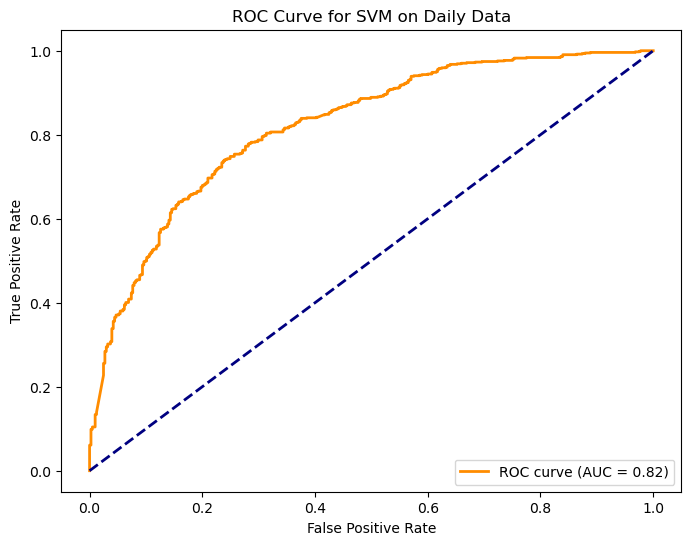

In [297]:
# ROC-AUC Curve
fpr, tpr, thresholds = roc_curve(y, y_pred_proba, pos_label=1)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for SVM on Daily Data')
plt.legend(loc='lower right')
plt.show()

## SVM WITH MODIFIED LOOCV ON DAILY DATA

In [305]:
overall_results = []

for depressed_participant in depressed_participants:
    non_depressed_participant = np.random.choice(non_depressed_participants)
    
    # Extract test set
    test_data = daily_stats[(daily_stats['person'] == depressed_participant) | (daily_stats['person'] == non_depressed_participant)]
    
    # Training set
    train_data = daily_stats[(daily_stats['person'] != depressed_participant) & (daily_stats['person'] != non_depressed_participant)]
    
    X_train = train_data.drop(columns=['person', 'status', 'timestamp', 'date'])
    y_train = le.transform(train_data['status'])
    X_test = test_data.drop(columns=['person', 'status', 'timestamp', 'date'])
    y_test = le.transform(test_data['status'])
    
    X_train = scaler.transform(X_train)
    X_test = scaler.transform(X_test)
    
    best_svm.fit(X_train, y_train)
    predictions = best_svm.predict(X_test)
    
    # Store the actual predictions
    result_dict = {
        'true_labels': y_test.tolist(),
        'predictions': predictions.tolist(),
        'probas': best_svm.decision_function(X_test).tolist()  # For SVM, use decision_function to get the "confidence scores"
    }
    
    report = classification_report(y_test, predictions, zero_division=1, output_dict=True)
    mcc = matthews_corrcoef(y_test, predictions)
    kappa = cohen_kappa_score(y_test, predictions)
    auc_score = roc_auc_score(y_test, best_svm.decision_function(X_test))  # Adjusted for SVM

    metrics_dict = {'report': report, 'mcc': mcc, 'kappa': kappa, 'auc': auc_score}

    # Merge the result_dict and metrics_dict
    combined_dict = {**result_dict, **metrics_dict}

    overall_results.append(combined_dict)





In [306]:
# Extract all true labels and predictions
all_true = []
all_preds = []

for result in overall_results:
    all_true.extend(result['true_labels'])
    all_preds.extend(result['predictions'])


# Metrics
print(classification_report(all_true, all_preds))
print("MCC:", matthews_corrcoef(all_true, all_preds))
print("Cohen's Kappa:", cohen_kappa_score(all_true, all_preds))

              precision    recall  f1-score   support

           0       0.71      0.50      0.59       405
           1       0.70      0.85      0.76       543

    accuracy                           0.70       948
   macro avg       0.70      0.68      0.68       948
weighted avg       0.70      0.70      0.69       948

MCC: 0.3777515270644018
Cohen's Kappa: 0.3643382300859882


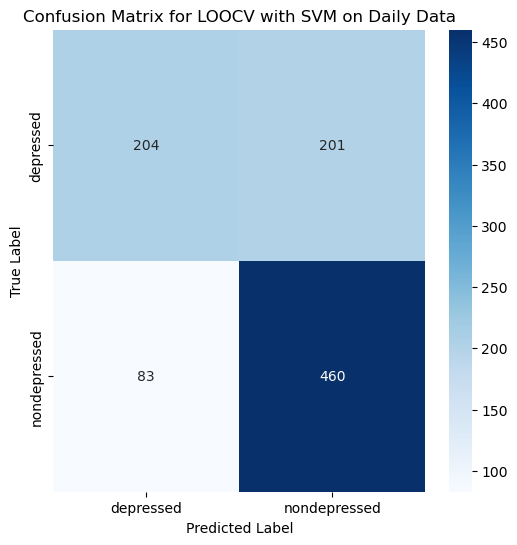

In [307]:
# Confusion Matrix
confusion = confusion_matrix(all_true, all_preds)
plt.figure(figsize=(6, 6))
sns.heatmap(confusion, annot=True, cmap="Blues", fmt="g", xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for LOOCV with SVM on Daily Data')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


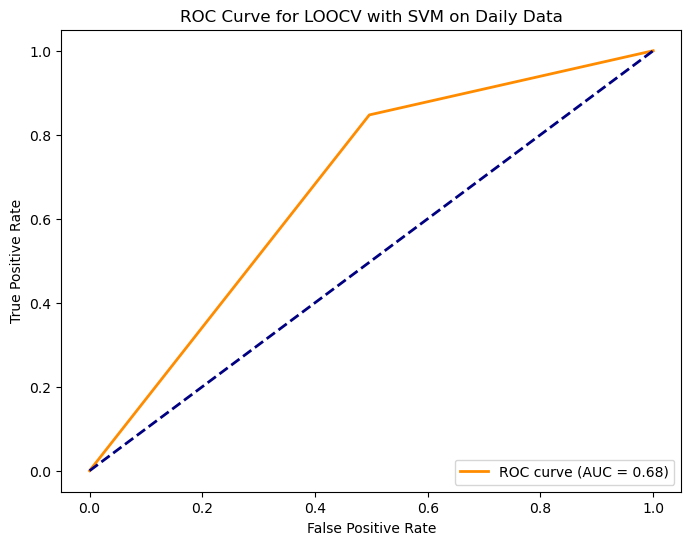

In [310]:
# ROC-AUC Curve
fpr, tpr, thresholds = roc_curve(all_true, all_preds, pos_label=1)  # Since 'depressed' is encoded as 1
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for LOOCV with SVM on Daily Data')
plt.legend(loc='lower right')
plt.show()
